# Setup and Context

This dataset contains house sales prices for King County, which includes Seattle. It includes homes sold between May 2014 and May 2015

| Variable      | Description                                                                                                 |
| ------------- | ----------------------------------------------------------------------------------------------------------- |
| id            | Unique ID per house sale                                                                                      |
| date          | Date house was sold                                                                                         |
| price         | Price of house sale in currency of USD                                                                               |
| bedrooms      | Number of bedrooms                                                                                          |
| bathrooms     | Number of bathrooms                                                                                         |
| sqft_living   | Number of Bathrooms, where 0.5 represents a bathroom with a toilet but with no shower                                                                               |
| sqft_lot      | Square footage of the land space                                                                                 |
| floors        | Total floors (levels) in house                                                                              |
| waterfront    | An index to indicate if the house was overlooking the waterfront or not. 0 represents no waterfront, 1 represents with waterfront.                                                                      |
| view          | An index from 0 to 4 of how good the view of the property was. 0 represents no good view, 4 represents very good view.                                                                                             |
| condition     | How good the condition is overall                                                                           |
| grade         | An index from 1 to 13. 1 to 3 falls short of building construction and design, 7 has an average level of construction and design, and 11 to 13 have higher quality level of construction and design.                                |
| sqft_above    | The square footage of the interior housing space that is above the ground level                                                                 |
| sqft_basement | Square footage of the basement                                                                              |
| yr_built      | Built Year                                                                                                  |
| yr_renovated  | Year when house was last renovated                                                                               |
| zipcode       | Zip code                                                                                                    |
| lat           | Latitude coordinate                                                                                         |
| long          | Longitude coordinate                                                                                        |
| sqft_living15 | The average square footage of interior housing living space for the nearest 15 neighboring houses |
| sqft_lot15    | The average square footage of land space for the nearest 15 neighboring houses  

Red section represents the city of Seattle

Orange section represents King County

<img src="King County map.png"/>

In [116]:
# Import Necessary Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import warnings
import matplotlib.ticker as ticker
import itertools
import plotly
import plotly.graph_objects as go
import statsmodels.api as sm
import scipy.stats as stats
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.neighbors import KNeighborsRegressor
from sklearn import metrics
from mpl_toolkits.mplot3d import Axes3D

# Configuration
%matplotlib inline

## Disable all warnings
warnings.filterwarnings('ignore')

## notebook presentation
pd.options.display.float_format = '{:,.3f}'.format

In [2]:
# Read the CSV file
df = pd.read_csv('kc_house_data_NaN.csv')

In [3]:
# lets get a quick overview of the dataframe
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 22 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Unnamed: 0     21613 non-null  int64  
 1   id             21613 non-null  int64  
 2   date           21613 non-null  object 
 3   price          21613 non-null  float64
 4   bedrooms       21600 non-null  float64
 5   bathrooms      21603 non-null  float64
 6   sqft_living    21613 non-null  int64  
 7   sqft_lot       21613 non-null  int64  
 8   floors         21613 non-null  float64
 9   waterfront     21613 non-null  int64  
 10  view           21613 non-null  int64  
 11  condition      21613 non-null  int64  
 12  grade          21613 non-null  int64  
 13  sqft_above     21613 non-null  int64  
 14  sqft_basement  21613 non-null  int64  
 15  yr_built       21613 non-null  int64  
 16  yr_renovated   21613 non-null  int64  
 17  zipcode        21613 non-null  int64  
 18  lat   

In [4]:
# Finding number of rows and columns (dimensions of data frame)
df.shape

(21613, 22)

There are a total of 21613 rows and 22 columns

In [5]:
df.head()

,Unnamed: 0,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,0,7129300520,20141013T000000,"221,900.00",3.00,1.00,1180,5650,1.00,0,...,7,1180,0,1955,0,98178,47.51,-122.26,1340,5650
1,1,6414100192,20141209T000000,"538,000.00",3.00,2.25,2570,7242,2.00,0,...,7,2170,400,1951,1991,98125,47.72,-122.32,1690,7639
2,2,5631500400,20150225T000000,"180,000.00",2.00,1.00,770,10000,1.00,0,...,6,770,0,1933,0,98028,47.74,-122.23,2720,8062
3,3,2487200875,20141209T000000,"604,000.00",4.00,3.00,1960,5000,1.00,0,...,7,1050,910,1965,0,98136,47.52,-122.39,1360,5000
4,4,1954400510,20150218T000000,"510,000.00",3.00,2.00,1680,8080,1.00,0,...,8,1680,0,1987,0,98074,47.62,-122.05,1800,7503


In [6]:
# check if there is null values
df.isnull().sum()

Unnamed: 0        0
id                0
date              0
price             0
bedrooms         13
bathrooms        10
sqft_living       0
sqft_lot          0
floors            0
waterfront        0
view              0
condition         0
grade             0
sqft_above        0
sqft_basement     0
yr_built          0
yr_renovated      0
zipcode           0
lat               0
long              0
sqft_living15     0
sqft_lot15        0
dtype: int64

There are some null values in the bedrooms and bathrooms columns, lets check and display the rows

In [7]:
df[(df.isnull().sum(axis=1)>0)]

,Unnamed: 0,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
875,875,6306400140,20140612T000000,"1,095,000.00",NaN,NaN,3064,4764,3.50,0,...,7,3064,0,1990,0,98102,47.64,-122.32,2360,4000
1149,1149,3421079032,20150217T000000,"75,000.00",1.00,NaN,670,43377,1.00,0,...,3,670,0,1966,0,98022,47.26,-121.91,1160,42882
3119,3119,3918400017,20150205T000000,"380,000.00",NaN,NaN,1470,979,3.00,0,...,8,1470,0,2006,0,98133,47.71,-122.36,1470,1399
3467,3467,1453602309,20140805T000000,"288,000.00",NaN,1.50,1430,1650,3.00,0,...,7,1430,0,1999,0,98125,47.72,-122.29,1430,1650
4868,4868,6896300380,20141002T000000,"228,000.00",NaN,1.00,390,5900,1.00,0,...,4,390,0,1953,0,98118,47.53,-122.26,2170,6000
5832,5832,5702500050,20141104T000000,"280,000.00",1.00,NaN,600,24501,1.00,0,...,3,600,0,1950,0,98045,47.53,-121.75,990,22549
6994,6994,2954400190,20140624T000000,"1,295,650.00",NaN,NaN,4810,28008,2.00,0,...,12,4810,0,1990,0,98053,47.66,-122.07,4740,35061
8477,8477,2569500210,20141117T000000,"339,950.00",NaN,2.50,2290,8319,2.00,0,...,8,2290,0,1985,0,98042,47.35,-122.15,2500,8751
8484,8484,2310060040,20140925T000000,"240,000.00",NaN,2.50,1810,5669,2.00,0,...,7,1810,0,2003,0,98038,47.35,-122.05,1810,5685
9773,9773,3374500520,20150429T000000,"355,000.00",NaN,NaN,2460,8049,2.00,0,...,8,2460,0,1990,0,98031,47.41,-122.17,2520,8050


In [8]:
# Lets repalce the missing values for the columns bedrooms and bathrooms using the mean values of the particular columns
mean_bedrooms = df['bedrooms'].mean()
mean_bathrooms = df['bathrooms'].mean()
df['bedrooms'].replace(np.nan, mean_bedrooms, inplace=True)
df['bathrooms'].replace(np.nan, mean_bathrooms, inplace=True)

In [9]:
# lets double check if there are still null values
df.isna().sum()

Unnamed: 0       0
id               0
date             0
price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
grade            0
sqft_above       0
sqft_basement    0
yr_built         0
yr_renovated     0
zipcode          0
lat              0
long             0
sqft_living15    0
sqft_lot15       0
dtype: int64

In [10]:
# lets drop the id and Unnamed:0 Columns as these columns are not relevant
df_refactored = df.drop(['id', 'Unnamed: 0'], axis=1)

In [11]:
# get the statistical summary of the dataframe
df_refactored.describe().T

,count,mean,std,min,25%,50%,75%,max
price,"21,613.00","540,088.14","367,127.20","75,000.00","321,950.00","450,000.00","645,000.00","7,700,000.00"
bedrooms,"21,613.00",3.37,0.93,1.00,3.00,3.00,4.00,33.00
bathrooms,"21,613.00",2.12,0.77,0.50,1.75,2.25,2.50,8.00
sqft_living,"21,613.00","2,079.90",918.44,290.00,"1,427.00","1,910.00","2,550.00","13,540.00"
sqft_lot,"21,613.00","15,106.97","41,420.51",520.00,"5,040.00","7,618.00","10,688.00","1,651,359.00"
floors,"21,613.00",1.49,0.54,1.00,1.00,1.50,2.00,3.50
waterfront,"21,613.00",0.01,0.09,0.00,0.00,0.00,0.00,1.00
view,"21,613.00",0.23,0.77,0.00,0.00,0.00,0.00,4.00
condition,"21,613.00",3.41,0.65,1.00,3.00,3.00,4.00,5.00
grade,"21,613.00",7.66,1.18,1.00,7.00,7.00,8.00,13.00


It seems that the house price range from \\$75k (cheapest) to \\$7.7 million (most expensive) with the lower end lot square footage of 520sqft and higher end lot square footage of 1.65 million sqft. upper quartile (75 percentile) of the houses have max of 4 bedrooms and 2 bathrooms while the lower quartile (25 percentile) has max of 3 bedrooms and 1 bathroom

In [12]:
# From df.describe() we can see that the date column is an object (ie: string).
# Lets Convert the date into Pandas datetime object
df_refactored['date'] = pd.to_datetime(df_refactored['date'])
df_refactored.head()

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,2014-10-13,"221,900.00",3.00,1.00,1180,5650,1.00,0,0,3,7,1180,0,1955,0,98178,47.51,-122.26,1340,5650
1,2014-12-09,"538,000.00",3.00,2.25,2570,7242,2.00,0,0,3,7,2170,400,1951,1991,98125,47.72,-122.32,1690,7639
2,2015-02-25,"180,000.00",2.00,1.00,770,10000,1.00,0,0,3,6,770,0,1933,0,98028,47.74,-122.23,2720,8062
3,2014-12-09,"604,000.00",4.00,3.00,1960,5000,1.00,0,0,5,7,1050,910,1965,0,98136,47.52,-122.39,1360,5000
4,2015-02-18,"510,000.00",3.00,2.00,1680,8080,1.00,0,0,3,8,1680,0,1987,0,98074,47.62,-122.05,1800,7503


In [13]:
# Lets check the dataframe dtype again
df_refactored.dtypes

date             datetime64[ns]
price                   float64
bedrooms                float64
bathrooms               float64
sqft_living               int64
sqft_lot                  int64
floors                  float64
waterfront                int64
view                      int64
condition                 int64
grade                     int64
sqft_above                int64
sqft_basement             int64
yr_built                  int64
yr_renovated              int64
zipcode                   int64
lat                     float64
long                    float64
sqft_living15             int64
sqft_lot15                int64
dtype: object

## Exploratory Data Analysis (EDA)

### Plot of King Country House Price on Map

For scattergeo plot, refer to following link:
https://towardsdatascience.com/how-to-build-an-immersive-geo-bubble-map-with-plotly-bb20eb70414f

In [14]:
# map with price hues
fig = px.scatter_mapbox(df_refactored,
                        lat="lat",
                        lon="long",
                        color='price',
                        hover_name="price",
                        hover_data=['bedrooms', 'bathrooms', 'sqft_living', 
                                    'sqft_lot', 'floors', 'waterfront', 'view',
                                    'condition', 'grade', 'yr_built'],
                        title = 'Historical King County House Sale Price',
                        zoom=8.4,
                        height=400,
                        # animation_frame="grade",
                        # animation_group="month",
                        color_continuous_scale=px.colors.cyclical.IceFire,
                        mapbox_style="carto-positron",
                        template='ggplot2',
                        size="price",
                        opacity=0.2
                       )
# tight layout
fig.update_layout(margin={"r":0,"t":30,"l":0,"b":0})
fig.show(config={'scrollZoom': True})

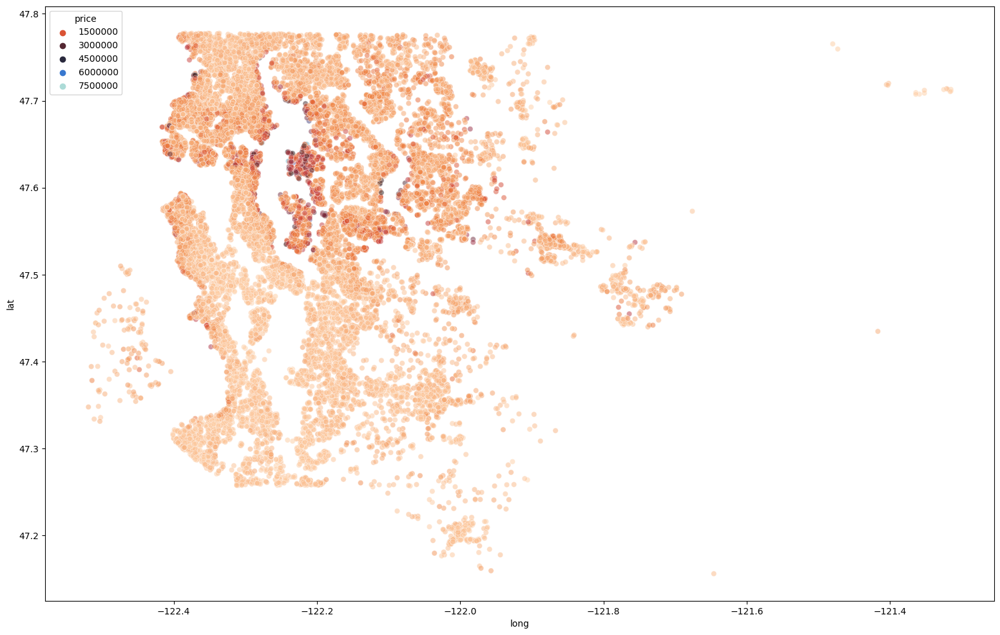

In [15]:
plt.figure(figsize=(19, 12))
sns.scatterplot(x='long', y='lat', data=df_refactored, hue='price', alpha=.5, palette='icefire_r')
plt.show()

#### Check when was the houses built

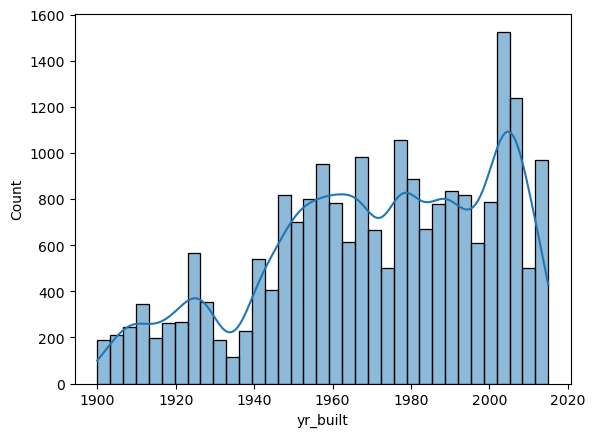

In [16]:
sns.histplot(data=df_refactored, x='yr_built', kde=True)
plt.show()

As the years pass, more and more house was built in the King's County area. We can see from the histogram that there were exponential growth after the year 1940 and then it stagnated for a period from 1960 up to 1990. Then it pick up again after the year 1990, there were a sudden increase in development activity and peak in the year 2000. From the chart, we can see that there are quite a number of houses have been around for more than 50 years with newer built house around 10 years and less.

#### Plot of House Sold After Its initial Year of Built

In [17]:
bins = [-2, 1, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 100000]
labels = ['<1', '1-10', '11-20', '20-30', '30-40', '40-50', '50-60', '60-70', '70-80', '80-90', '90-100', '>100']
df_refactored['year_sold'] = pd.DatetimeIndex(df_refactored['date']).year
df_refactored['age_sold'] = (df_refactored['year_sold'] - df_refactored['yr_built']).astype(int)
df_refactored['age_by_decade'] = pd.cut(x=df_refactored['age_sold'], bins=bins, labels=labels)
df_refactored.head()

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,...,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year_sold,age_sold,age_by_decade
0,2014-10-13,"221,900.00",3.00,1.00,1180,5650,1.00,0,0,3,...,1955,0,98178,47.51,-122.26,1340,5650,2014,59,50-60
1,2014-12-09,"538,000.00",3.00,2.25,2570,7242,2.00,0,0,3,...,1951,1991,98125,47.72,-122.32,1690,7639,2014,63,60-70
2,2015-02-25,"180,000.00",2.00,1.00,770,10000,1.00,0,0,3,...,1933,0,98028,47.74,-122.23,2720,8062,2015,82,80-90
3,2014-12-09,"604,000.00",4.00,3.00,1960,5000,1.00,0,0,5,...,1965,0,98136,47.52,-122.39,1360,5000,2014,49,40-50
4,2015-02-18,"510,000.00",3.00,2.00,1680,8080,1.00,0,0,3,...,1987,0,98074,47.62,-122.05,1800,7503,2015,28,20-30


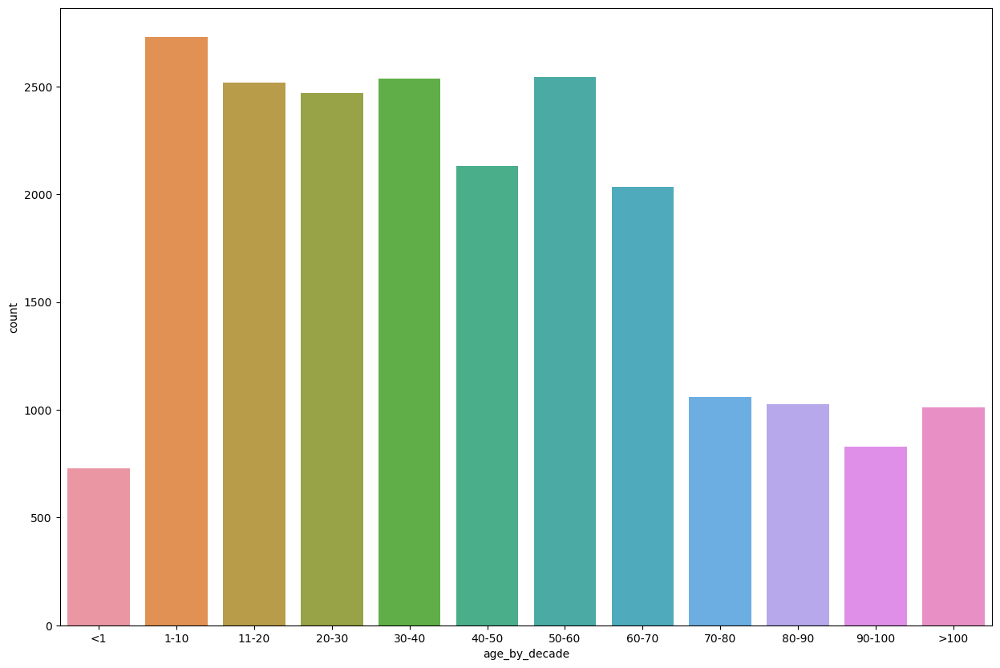

In [18]:
plt.figure(figsize=(15, 10))
sns.countplot(data=df_refactored, x='age_by_decade')
plt.show()

We can see that newer housing development of less than 10 years are the most sold property (preferred) compared to other range of age. Although there are quite substantial number of people who also buy older house, but generally, buyers prefer newer development over older ones. The older house were generally bought and renovated (older than 30 years) as shown in below chart.

In [19]:
df_refactored['renovated_before'] = (df_refactored['yr_renovated']>0).astype(int)
df_refactored.head()

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,...,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year_sold,age_sold,age_by_decade,renovated_before
0,2014-10-13,"221,900.00",3.00,1.00,1180,5650,1.00,0,0,3,...,0,98178,47.51,-122.26,1340,5650,2014,59,50-60,0
1,2014-12-09,"538,000.00",3.00,2.25,2570,7242,2.00,0,0,3,...,1991,98125,47.72,-122.32,1690,7639,2014,63,60-70,1
2,2015-02-25,"180,000.00",2.00,1.00,770,10000,1.00,0,0,3,...,0,98028,47.74,-122.23,2720,8062,2015,82,80-90,0
3,2014-12-09,"604,000.00",4.00,3.00,1960,5000,1.00,0,0,5,...,0,98136,47.52,-122.39,1360,5000,2014,49,40-50,0
4,2015-02-18,"510,000.00",3.00,2.00,1680,8080,1.00,0,0,3,...,0,98074,47.62,-122.05,1800,7503,2015,28,20-30,0


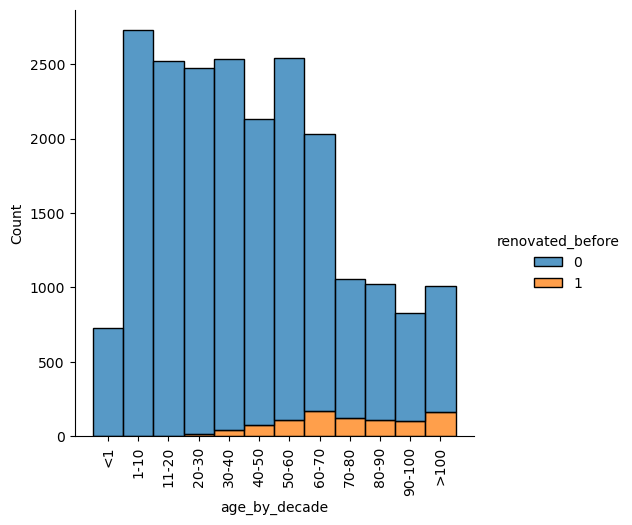

In [20]:
#sns.countplot(data=df_refactored, x='age_by_decade', hue='renovated_before')
sns.displot(data=df_refactored, x='age_by_decade', hue='renovated_before', multiple='stack')
plt.xticks(rotation=90)
plt.show()

### Univariate Analysis

In [21]:
df_refactored.dtypes

date                datetime64[ns]
price                      float64
bedrooms                   float64
bathrooms                  float64
sqft_living                  int64
sqft_lot                     int64
floors                     float64
waterfront                   int64
view                         int64
condition                    int64
grade                        int64
sqft_above                   int64
sqft_basement                int64
yr_built                     int64
yr_renovated                 int64
zipcode                      int64
lat                        float64
long                       float64
sqft_living15                int64
sqft_lot15                   int64
year_sold                    int64
age_sold                     int64
age_by_decade             category
renovated_before             int64
dtype: object

Text(0.5, 0.98, 'Histograms of various features')

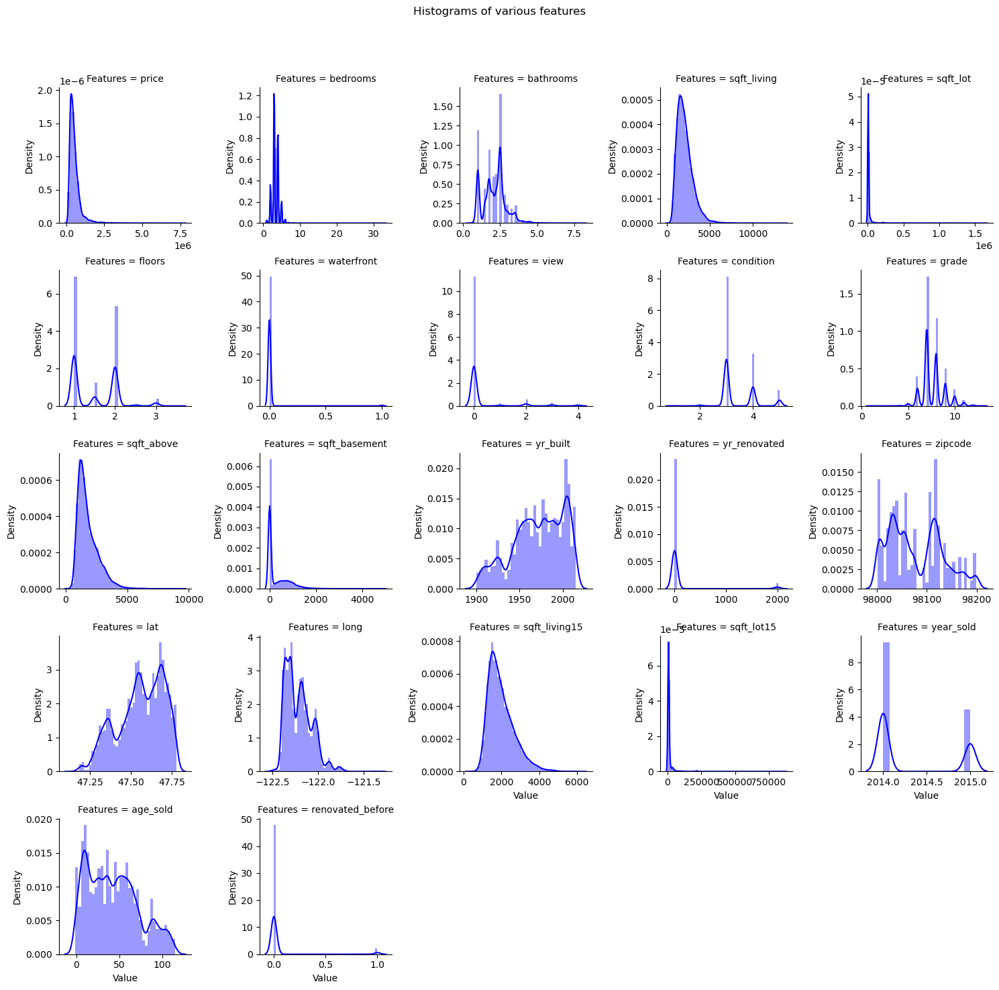

In [22]:
# Lets see the price distribution with respect to features
numeric_features= df_refactored.select_dtypes(exclude=["object","bool","datetime64[ns]", "category"])
numeric_features = numeric_features.stack().reset_index().rename(columns = {"level_1":"Features",0:"Value"})
g = sns.FacetGrid(data =numeric_features, col="Features",  col_wrap=5, sharex=False, sharey=False)
g = g.map(sns.distplot, "Value", color ='blue')
plt.subplots_adjust(top=0.9)
plt.suptitle("Histograms of various features")

This is a highly skewed distribution. We will use log transformation on the later parts on these column to see if that helps normalize the distribution

#### Checking for Outliers in Waterfront against price

<AxesSubplot:xlabel='waterfront', ylabel='price'>

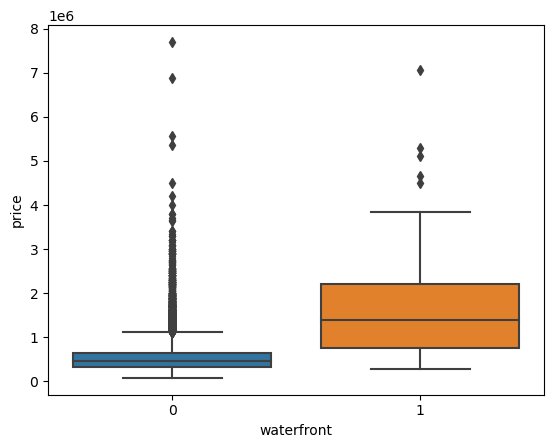

In [23]:
# Lets determine whether houses with waterfront view or without waterfront view have more price outlier
sns.boxplot(x='waterfront', y='price', data=df_refactored)

From the plot, it seems that 'No waterfront' view have more price outlier

#### Price vs Living Space

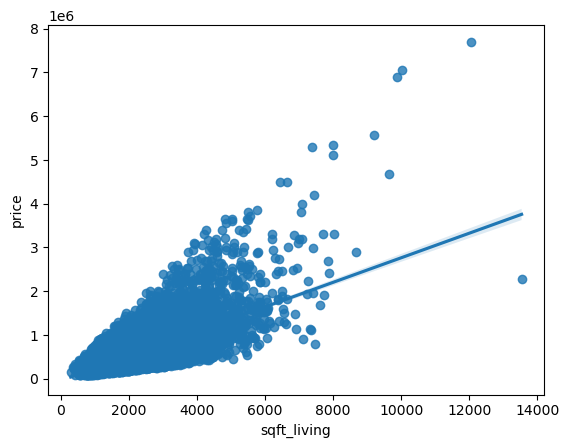

In [24]:
sns.regplot(x='sqft_living', y='price', data=df_refactored)
plt.show()

There is strong positive correlation between living space and price.

#### Price vs Space above 

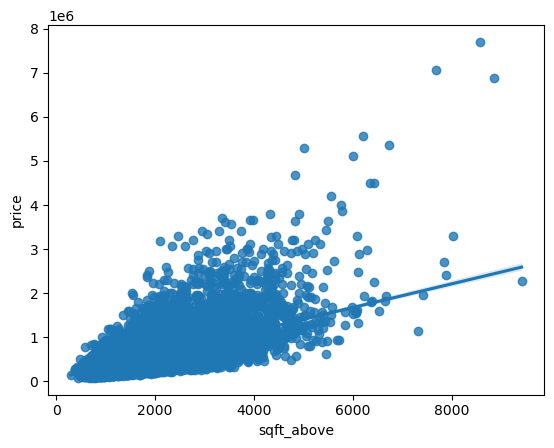

In [25]:
# Lets see if sqft_above is negative or positively correlated with price
sns.regplot(x='sqft_above', y='price', data=df_refactored)
plt.show()

#### Price vs Waterfront

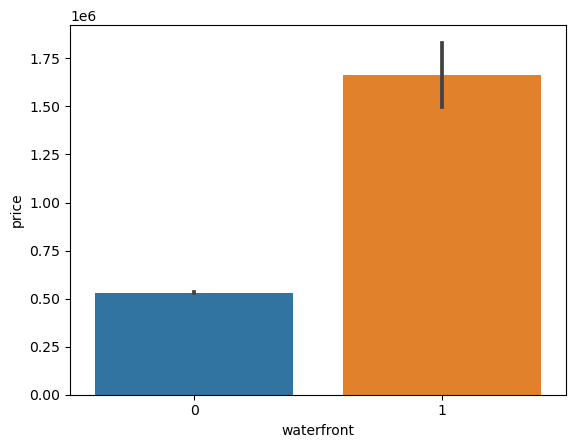

In [26]:
sns.barplot(x='waterfront', y='price', data=df_refactored)
plt.show()

It is clear that houses with waterfront tend to have higher price than no-waterfront

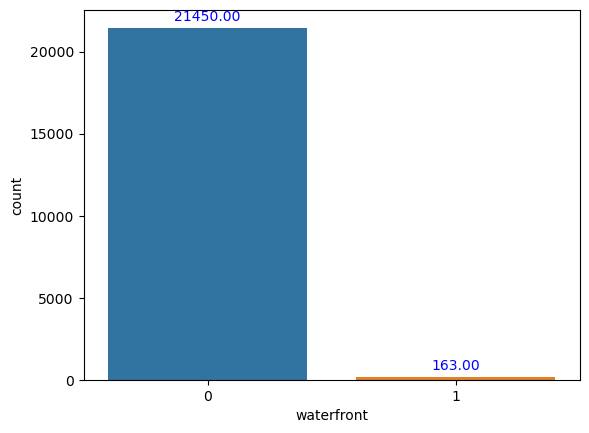

In [27]:
# Lets check how many houses in the dataset has waterfront 
ax = sns.countplot(df_refactored, x='waterfront')
for bar in ax.patches:
    ax.annotate(text=format(bar.get_height(), '.2f'), 
                xy=(bar.get_x()+bar.get_width()/2, bar.get_height()), 
                ha='center',
                va='center',
                size=10,
                xytext=(0, 8),
                textcoords='offset points',
                color='blue')
plt.show()

There are a total of 163 houses in the dataset with waterfronts and the remainder has no waterfronts. This may also be a major factor which contributes to the higher price of house with waterfronts since it is more rare. 

#### Price vs House Condition

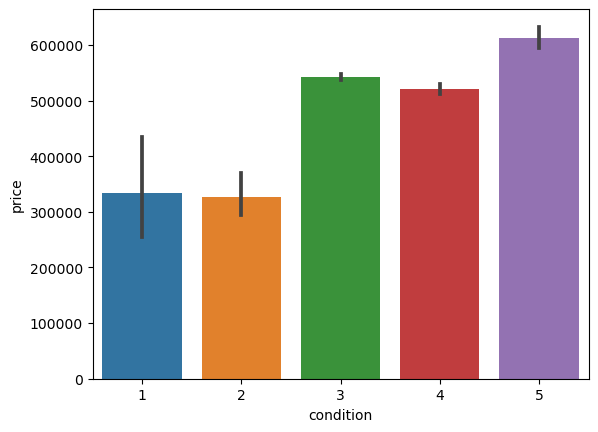

In [28]:
# Lets check if price is affected by condition in the dataset
sns.barplot(data=df_refactored, x='condition', y='price')
plt.show()

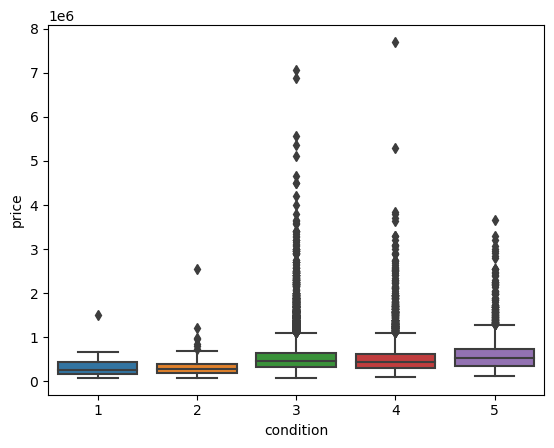

In [29]:
sns.boxplot(data=df_refactored, x='condition', y='price')
plt.show()

It does not seem that house condition has any major affect on the price as we can see that tier 3, 4, 5 housing condition price are very close. From boxplot, we can see that different condition has significant overlap, hence, it would not make a good predictor of price. In addition, the condition=3 has more price outliers compared to other conditions.

#### Price vs Grade

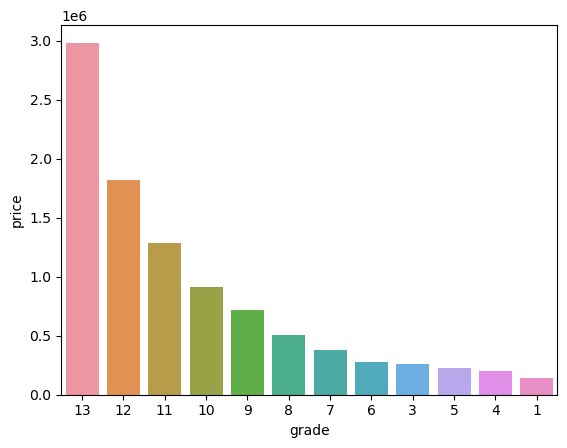

In [30]:
# Let check the median price range of by grade
price_grade_med = df_refactored.groupby('grade')['price'].median()
sns.barplot(data=price_grade_med.reset_index(), 
            x='grade', 
            y='price', 
            order=price_grade_med.reset_index().sort_values('price',ascending = False).grade)
plt.show()

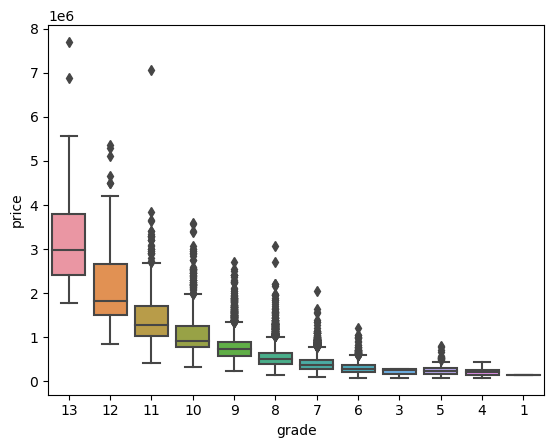

In [31]:
sns.boxplot(data=df_refactored, 
            x='grade', 
            y='price', 
            order=price_grade_med.reset_index().sort_values('price',ascending = False).grade)
plt.show()

From the above, we can see clearly that better grades comes with higher price. From the boxplot, we can see that different grades are distinct enough to make it a potential good predictor of price.

#### Price vs Bathrooms

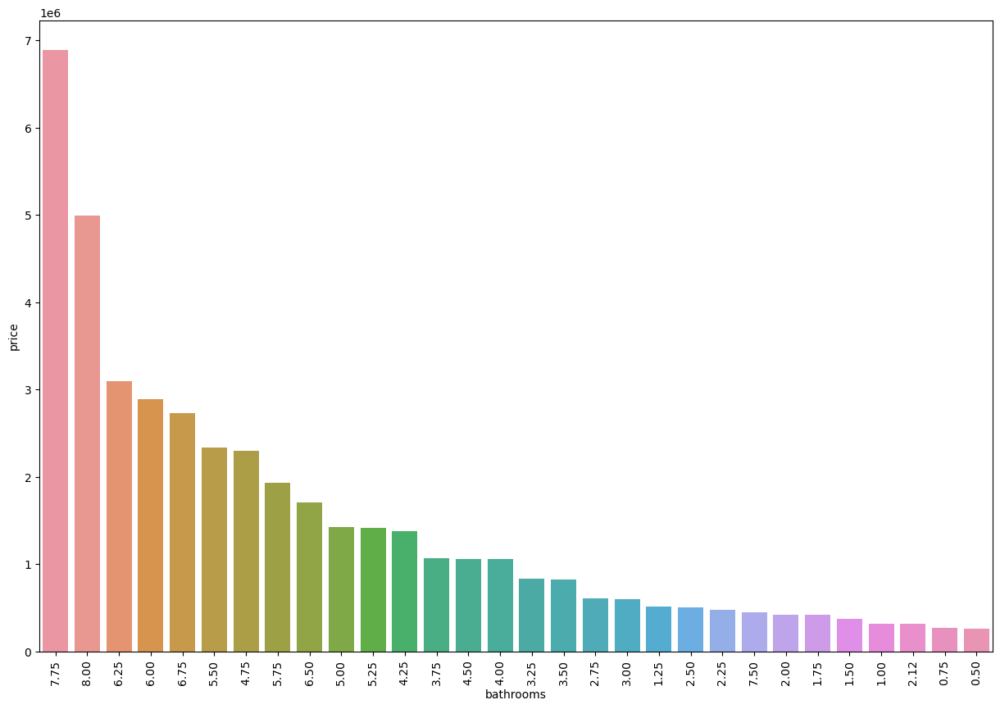

In [32]:
# lets check the median price range by bathrooms count
price_bathrooms_med = df_refactored.groupby('bathrooms')['price'].median()
plt.figure(figsize=(15, 10))
ax = sns.barplot(data=price_bathrooms_med.reset_index(), 
            x='bathrooms', 
            y='price', 
            order=price_bathrooms_med.reset_index().sort_values('price',ascending = False).bathrooms)
fmt = lambda x: "{:.2f}".format(x)
label_xticks=[float(item.get_text()) for item in ax.get_xticklabels()]
ax.set_xticklabels(labels=[fmt(i) for i in label_xticks], rotation=90)
plt.show()

It seems that higher number of bathrooms contributes to the higher prices of the house

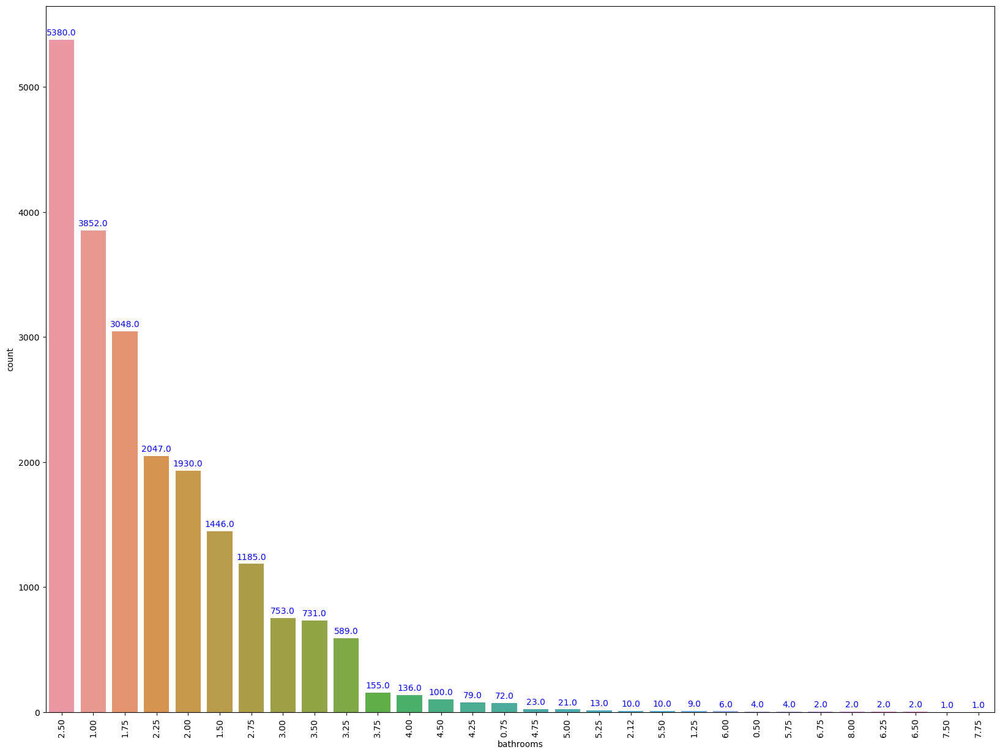

In [33]:
# Lets take a look closer to the number of bathrooms by countplot
plt.figure(figsize=(20, 15))
ax=sns.countplot(df_refactored, x='bathrooms', order=df_refactored.bathrooms.value_counts().index)
fmt = lambda x: "{:.2f}".format(x)
label_xticks=[float(item.get_text()) for item in ax.get_xticklabels()]
ax.set_xticklabels(labels=[fmt(i) for i in label_xticks], rotation=90)
for bar in ax.patches:
    ax.annotate(text=format(bar.get_height(), '.1f'), 
                xy=(bar.get_x()+bar.get_width()/2, bar.get_height()), 
                ha='center',
                va='center',
                size=10,
                xytext=(0, 8),
                textcoords='offset points',
                color='blue')
plt.show()

In [34]:
df_refactored.bathrooms.value_counts()

2.50    5380
1.00    3852
1.75    3048
2.25    2047
2.00    1930
1.50    1446
2.75    1185
3.00     753
3.50     731
3.25     589
3.75     155
4.00     136
4.50     100
4.25      79
0.75      72
4.75      23
5.00      21
5.25      13
2.12      10
5.50      10
1.25       9
6.00       6
0.50       4
5.75       4
6.75       2
8.00       2
6.25       2
6.50       2
7.50       1
7.75       1
Name: bathrooms, dtype: int64

Most of the house have approximate at least 2 bathrooms. Houses with more than 5 bathrooms are less common.

#### Price vs View

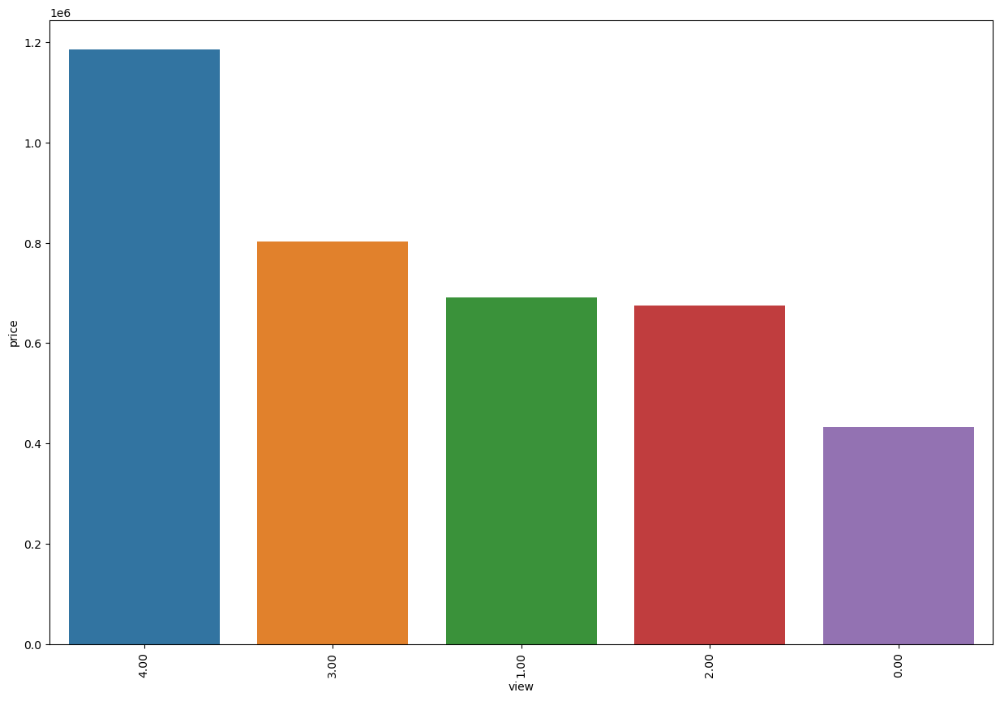

In [35]:
price_bathrooms_med = df_refactored.groupby('view')['price'].median()
plt.figure(figsize=(15, 10))
ax = sns.barplot(data=price_bathrooms_med.reset_index(), 
            x='view', 
            y='price', 
            order=price_bathrooms_med.reset_index().sort_values('price',ascending = False).view)
fmt = lambda x: "{:.2f}".format(x)
label_xticks=[float(item.get_text()) for item in ax.get_xticklabels()]
ax.set_xticklabels(labels=[fmt(i) for i in label_xticks], rotation=90)
plt.show()

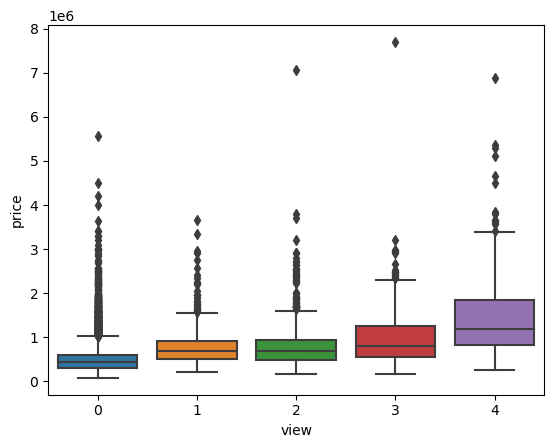

In [36]:
sns.boxplot(data=df_refactored, x='view', y='price')
plt.show()

Better view comes with higher price tag. However, we can also see that view 1 and 2 has only minor price increase. From the boxplot, it seems that no-view (view=0) has more price outlier than other views. Furthermore, we can also observed that the distribution of price between the different views catagories have a significant overlap, so "view" feature would not be a good prediction of price.

### Multivariate analysis

In [37]:
# Lets check correlation of the dataset
# Exclude date and year from correlation
df_corr_col = list(set(df_refactored.columns) - set(['date', 'year']))
df_refactored[df_corr_col].corr()

,sqft_lot15,price,sqft_living,renovated_before,year_sold,view,zipcode,sqft_above,sqft_lot,yr_built,...,bedrooms,sqft_living15,bathrooms,condition,grade,sqft_basement,long,yr_renovated,waterfront,age_sold
sqft_lot15,1.00,0.08,0.18,0.01,-0.00,0.07,-0.15,0.19,0.72,0.07,...,0.03,0.18,0.09,-0.00,0.12,0.02,0.25,0.01,0.03,-0.07
price,0.08,1.00,0.70,0.13,0.00,0.40,-0.05,0.61,0.09,0.05,...,0.31,0.59,0.53,0.04,0.67,0.32,0.02,0.13,0.27,-0.05
sqft_living,0.18,0.70,1.00,0.06,-0.03,0.28,-0.20,0.88,0.17,0.32,...,0.58,0.76,0.76,-0.06,0.76,0.44,0.24,0.06,0.10,-0.32
renovated_before,0.01,0.13,0.06,1.00,-0.02,0.10,0.06,0.02,0.01,-0.23,...,0.02,-0.00,0.05,-0.06,0.01,0.07,-0.07,1.00,0.09,0.22
year_sold,-0.00,0.00,-0.03,-0.02,1.00,0.00,0.00,-0.02,0.01,0.00,...,-0.01,-0.02,-0.03,-0.05,-0.03,-0.02,0.00,-0.02,-0.00,0.01
view,0.07,0.40,0.28,0.10,0.00,1.00,0.08,0.17,0.07,-0.05,...,0.08,0.28,0.19,0.05,0.25,0.28,-0.08,0.10,0.40,0.05
zipcode,-0.15,-0.05,-0.20,0.06,0.00,0.08,1.00,-0.26,-0.13,-0.35,...,-0.15,-0.28,-0.20,0.00,-0.18,0.07,-0.56,0.06,0.03,0.35
sqft_above,0.19,0.61,0.88,0.02,-0.02,0.17,-0.26,1.00,0.18,0.42,...,0.48,0.73,0.69,-0.16,0.76,-0.05,0.34,0.02,0.07,-0.42
sqft_lot,0.72,0.09,0.17,0.01,0.01,0.07,-0.13,0.18,1.00,0.05,...,0.03,0.14,0.09,-0.01,0.11,0.02,0.23,0.01,0.02,-0.05
yr_built,0.07,0.05,0.32,-0.23,0.00,-0.05,-0.35,0.42,0.05,1.00,...,0.16,0.33,0.51,-0.36,0.45,-0.13,0.41,-0.22,-0.03,-1.00


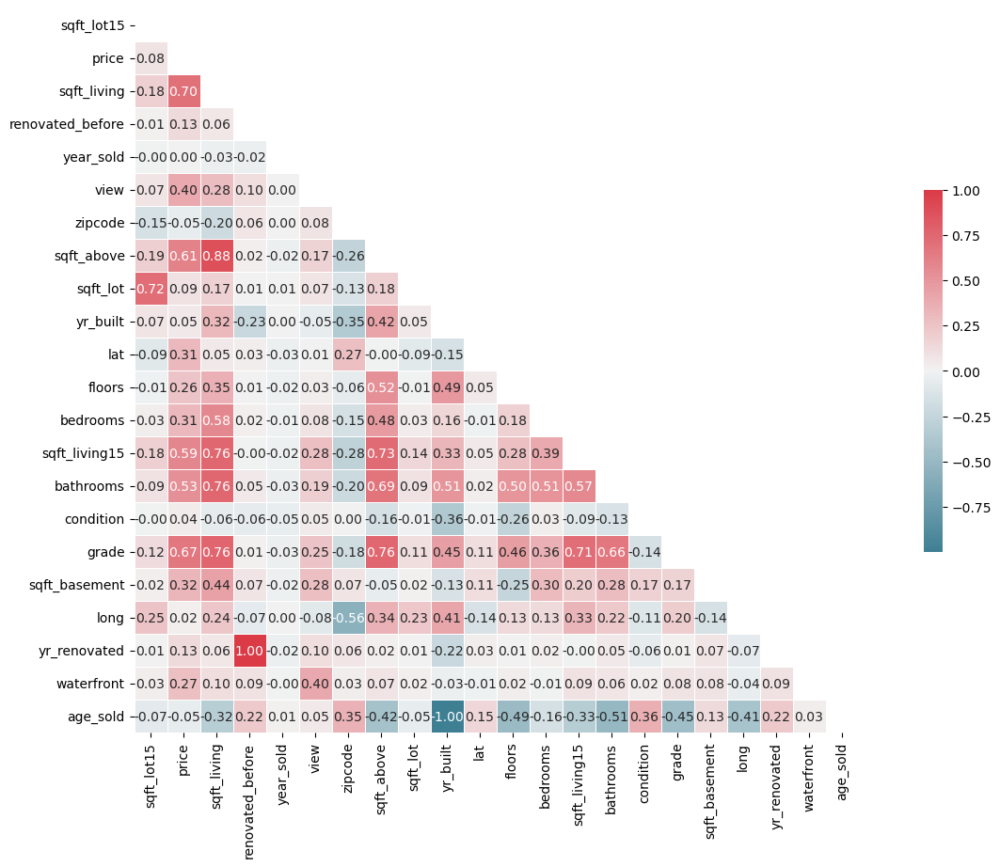

In [38]:
# lets visualize with heatmap
plt.figure(figsize=(18,10))
corr = df_refactored[df_corr_col].corr()

# To display diagonal matrix instead of full matrix
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(
    data=corr, 
    mask=mask, 
    annot=True, 
    cmap=cmap, 
    vmax=1, # Color scale the max
    center=0, # color scale palce at the center at 0
    fmt='.2f',
    square=True, # Each cell will be square-shaped
    linewidth=.5, 
    cbar_kws={"shrink":.5}
    )
plt.show()

From the heatmap, we can see that price has high correlation with the following:
- sqft_living
- grade
- sqft_above
- sqft_living15
- bathrooms

These make sense since higher grade implies that it may have better quality leading to increase price. Also, higher squarefoot area also implies higher pricing

In [39]:
# Lets sort the dataframe correlation to have a better view of features with price relationship
house_corr = df_refactored.corr()['price'].sort_values()
house_corr

age_sold           -0.05
zipcode            -0.05
year_sold           0.00
long                0.02
condition           0.04
yr_built            0.05
sqft_lot15          0.08
sqft_lot            0.09
renovated_before    0.13
yr_renovated        0.13
floors              0.26
waterfront          0.27
lat                 0.31
bedrooms            0.31
sqft_basement       0.32
view                0.40
bathrooms           0.53
sqft_living15       0.59
sqft_above          0.61
grade               0.67
sqft_living         0.70
price               1.00
Name: price, dtype: float64

Again, we can see that sqft_living has the highest correlation with price among other features

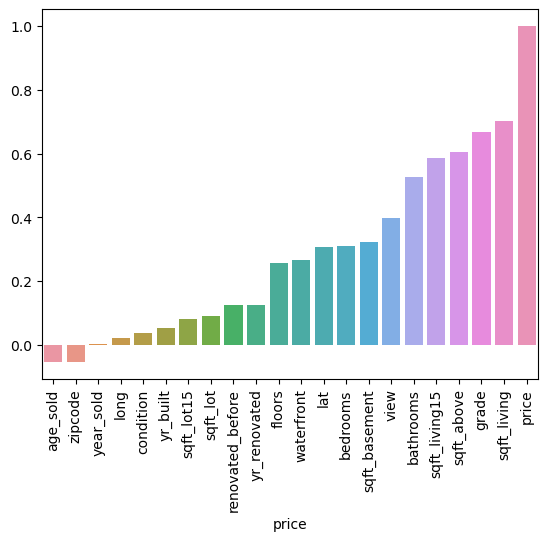

In [40]:
# plot of price vs other features
ax = sns.barplot(data=house_corr, x=house_corr.index, y=house_corr.values)
ax.set_xticklabels(labels=house_corr.index, rotation=90)
plt.show()

## Model Development

### Feature Engineering

Before we start out model development, lets check the skewness of each features

In [41]:
skew_limit = 0.75
skew_vals = df_refactored[df_refactored.columns].skew()

skew_cols = (skew_vals
             .sort_values(ascending=False)
             .to_frame()
             .rename(columns={0:'Skew'})
             .query('abs(Skew) > {0}'.format(skew_limit)))

skew_cols

,Skew
sqft_lot,13.06
waterfront,11.39
sqft_lot15,9.51
yr_renovated,4.55
renovated_before,4.55
price,4.02
view,3.40
bedrooms,2.02
sqft_basement,1.58
sqft_living,1.47


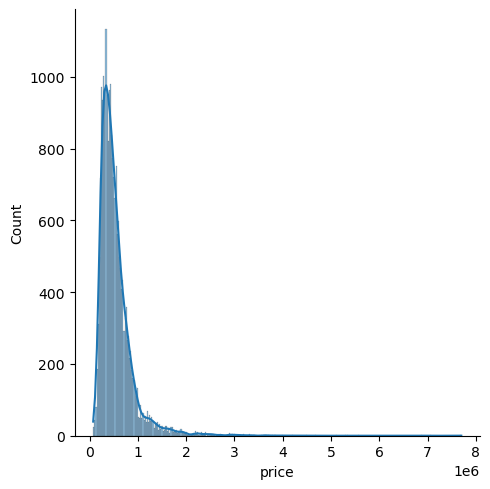

In [42]:
# Lets take a closer look on the price distribution
sns.displot(data=df_refactored, x='price', kde=True)
plt.show()

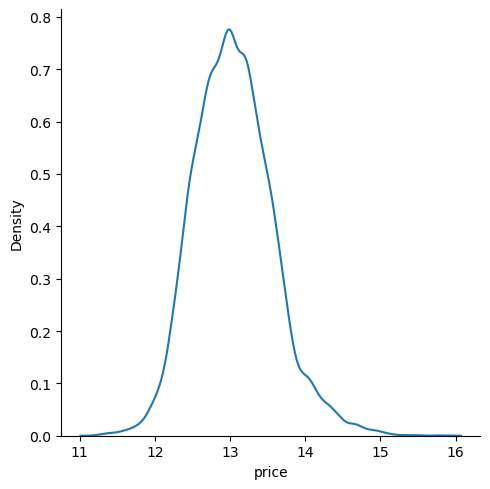

In [43]:
sns.displot(data=np.log(df_refactored['price']),kind='kde')
plt.show()

Log transformation has definitely help in reducing the skewness

In [44]:
# Adjust the original data and replace with log transform price
df_refactored['price_log'] = np.log(df_refactored['price'])
df_refactored.head()

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,...,zipcode,lat,long,sqft_living15,sqft_lot15,year_sold,age_sold,age_by_decade,renovated_before,price_log
0,2014-10-13,"221,900.00",3.00,1.00,1180,5650,1.00,0,0,3,...,98178,47.51,-122.26,1340,5650,2014,59,50-60,0,12.31
1,2014-12-09,"538,000.00",3.00,2.25,2570,7242,2.00,0,0,3,...,98125,47.72,-122.32,1690,7639,2014,63,60-70,1,13.20
2,2015-02-25,"180,000.00",2.00,1.00,770,10000,1.00,0,0,3,...,98028,47.74,-122.23,2720,8062,2015,82,80-90,0,12.10
3,2014-12-09,"604,000.00",4.00,3.00,1960,5000,1.00,0,0,5,...,98136,47.52,-122.39,1360,5000,2014,49,40-50,0,13.31
4,2015-02-18,"510,000.00",3.00,2.00,1680,8080,1.00,0,0,3,...,98074,47.62,-122.05,1800,7503,2015,28,20-30,0,13.14


#### Use QQ plot to see if the price and sqft_living follows the normal distribution

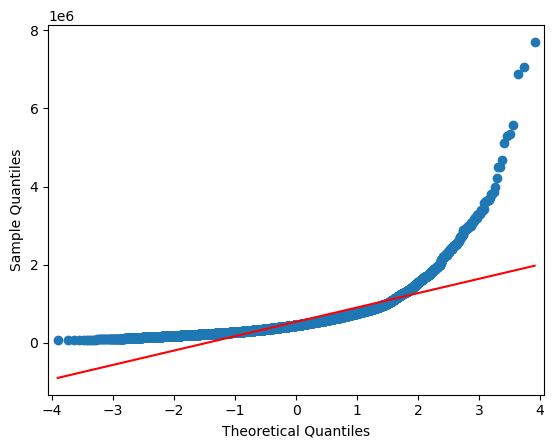

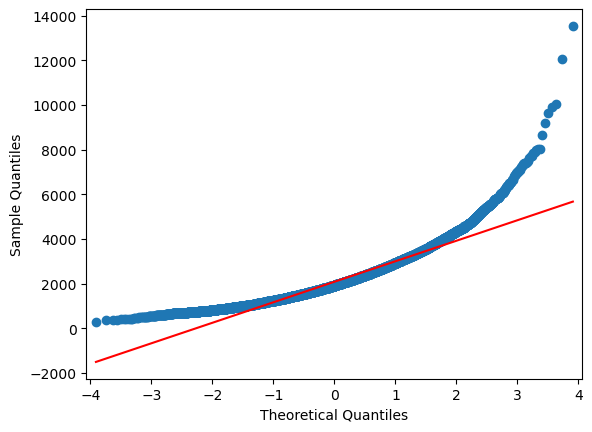

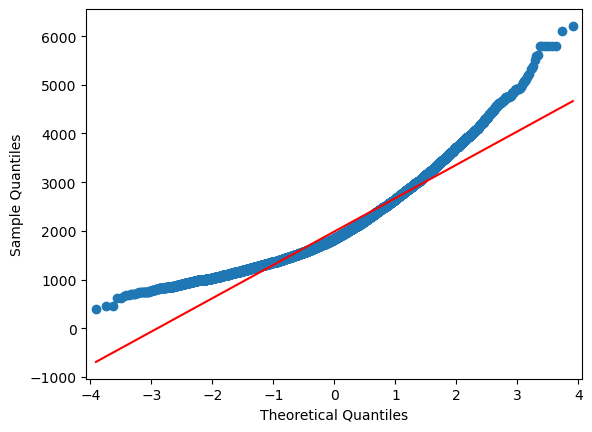

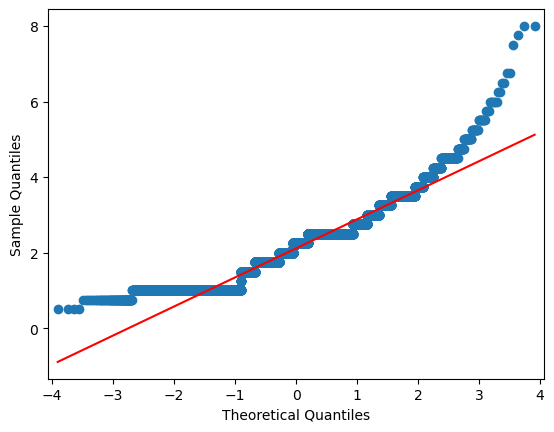

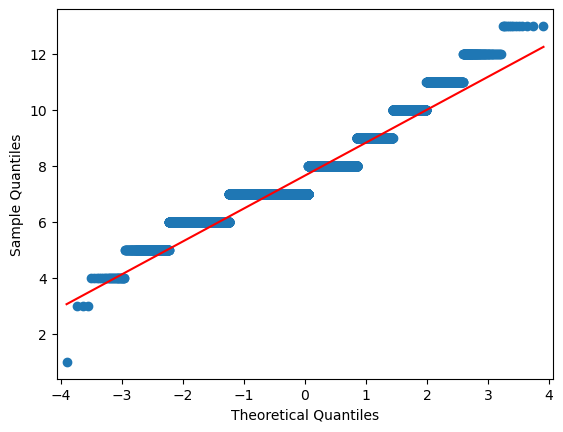

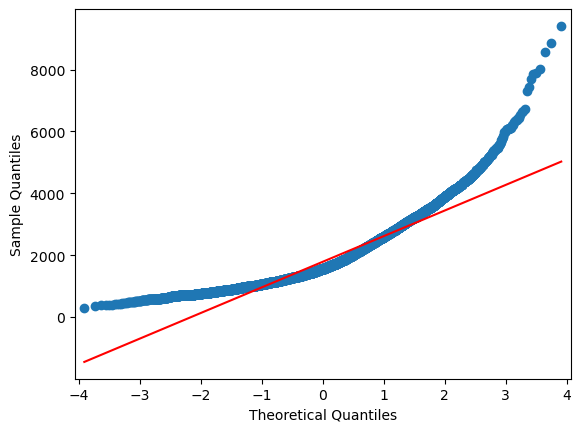

In [45]:
for i in ['price', 'sqft_living', 'sqft_living15', 'bathrooms', 'grade', 'sqft_above']:
    sm.qqplot(df_refactored[i], line='s')
plt.show()

Price, sqft_living, sqft_living15 and bathrooms does not follows normal distribution, so we may have to perform feature transformation

In [46]:
# Lets transform the sqft_living and sqft_living15 by log to reduce the skewness
df_refactored[['sqft_living_log', 'sqft_living15_log', 'bathrooms_log', 'sqft_above_log']] = df_refactored[['sqft_living', 'sqft_living15', 'bathrooms', 'sqft_above']].apply(np.log)
df_refactored.head()

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,...,sqft_lot15,year_sold,age_sold,age_by_decade,renovated_before,price_log,sqft_living_log,sqft_living15_log,bathrooms_log,sqft_above_log
0,2014-10-13,"221,900.00",3.00,1.00,1180,5650,1.00,0,0,3,...,5650,2014,59,50-60,0,12.31,7.07,7.20,0.00,7.07
1,2014-12-09,"538,000.00",3.00,2.25,2570,7242,2.00,0,0,3,...,7639,2014,63,60-70,1,13.20,7.85,7.43,0.81,7.68
2,2015-02-25,"180,000.00",2.00,1.00,770,10000,1.00,0,0,3,...,8062,2015,82,80-90,0,12.10,6.65,7.91,0.00,6.65
3,2014-12-09,"604,000.00",4.00,3.00,1960,5000,1.00,0,0,5,...,5000,2014,49,40-50,0,13.31,7.58,7.22,1.10,6.96
4,2015-02-18,"510,000.00",3.00,2.00,1680,8080,1.00,0,0,3,...,7503,2015,28,20-30,0,13.14,7.43,7.50,0.69,7.43


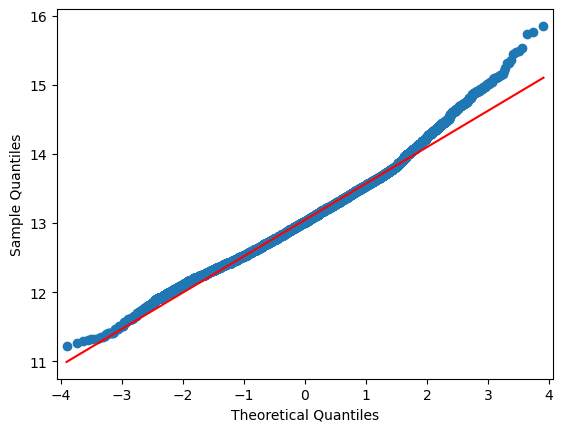

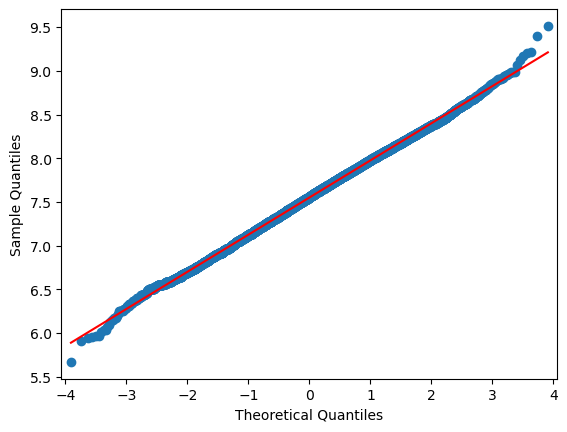

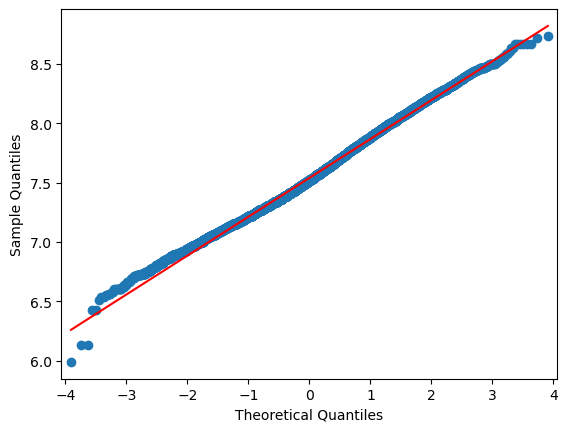

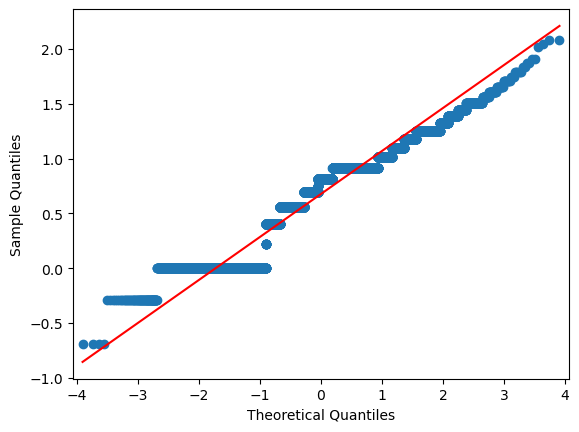

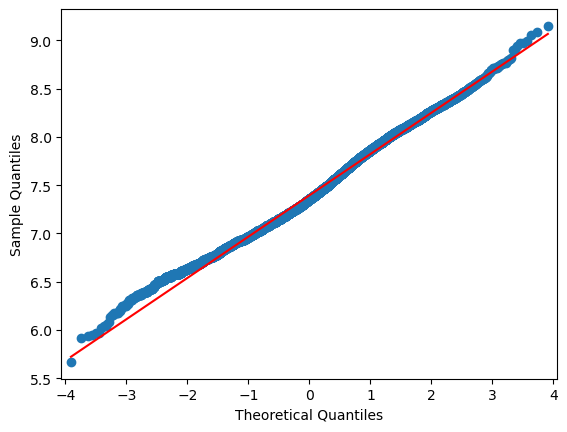

In [47]:
# Lets recheck the QQ plot again
for i in ['price_log', 'sqft_living_log', 'sqft_living15_log', 'bathrooms_log', 'sqft_above_log']:
    sm.qqplot(df_refactored[i], line='s')
plt.show()

The skewness has reduced and normality is better now

### Split the data into test and train set

In [48]:
# Lets check the columns
df_refactored.columns

Index(['date', 'price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot',
       'floors', 'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long',
       'sqft_living15', 'sqft_lot15', 'year_sold', 'age_sold', 'age_by_decade',
       'renovated_before', 'price_log', 'sqft_living_log', 'sqft_living15_log',
       'bathrooms_log', 'sqft_above_log'],
      dtype='object')

In [49]:
# we do not need age_by_decade and date since these are not useful for modelling.
# Also all the original column that has been transform by log operation, need not be included
col_to_exclude = ['age_by_decade', 'date', 'price_log', 'sqft_living', 'sqft_living15', 'bathrooms', 'sqft_above']
col_include = list(set(df_refactored.columns) - set(col_to_exclude))
X = df_refactored[col_include]
Y = df_refactored['price_log']
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=0)

In [50]:
print("number of test sample:", x_test.shape[0])
print("number of training sample:", x_train.shape[0])

number of test sample: 4323
number of training sample: 17290


### Scaling

In [51]:
scaler = StandardScaler()

# apply the transformation to the training data
x_train_scaled = scaler.fit_transform(x_train)

# Apply the transformation to the testing data
x_test_scaled = scaler.transform(x_test)

# Convert the array back to pandas dataframe
x_train_scaled = pd.DataFrame(x_train_scaled, columns=x_train.columns)

# View 
x_train_scaled.head()

,sqft_lot15,sqft_living15_log,renovated_before,year_sold,view,zipcode,sqft_above_log,sqft_lot,yr_built,floors,...,yr_renovated,price,sqft_living_log,lat,bedrooms,grade,sqft_basement,long,waterfront,age_sold
0,-0.23,-0.19,-0.21,1.44,-0.31,0.69,-0.98,-0.23,-1.05,-0.92,...,-0.21,-0.13,-0.45,0.96,-0.39,-0.56,0.47,-0.74,-0.09,1.07
1,-0.11,0.63,-0.21,-0.69,-0.31,-1.34,-0.69,-0.10,0.31,-0.92,...,-0.21,0.25,-0.15,-0.02,-0.39,0.29,0.62,0.46,-0.09,-0.32
2,-0.11,-0.29,-0.21,1.44,-0.31,-0.07,-0.93,-0.13,0.54,-0.92,...,-0.21,-0.43,-1.30,0.47,-0.39,0.29,-0.66,1.27,-0.09,-0.52
3,-0.21,0.14,-0.21,-0.69,-0.31,-0.88,0.71,-0.19,0.75,0.93,...,-0.21,-0.43,0.35,-1.01,0.67,0.29,-0.66,0.22,-0.09,-0.76
4,-0.29,-0.15,-0.21,-0.69,-0.31,0.77,-0.63,-0.25,0.48,0.93,...,-0.21,0.34,-0.13,0.62,-0.39,-0.56,0.60,-1.05,-0.09,-0.49


In [52]:
# Create an empty dataframe to keep track of the r2 score and mse of the different models
res = pd.DataFrame()

### Simple Linear Regression

In [53]:
lm = LinearRegression()
lm.fit(x_train_scaled, y_train)

LinearRegression()

In [54]:
print('Intercept: {}'.format(lm.intercept_))
print('Regression Coefficients:')
pd.DataFrame(lm.coef_, index=x_train_scaled.columns, columns=['Coefficient'])

Intercept: 13.05141251859369
Regression Coefficients:


,Coefficient
sqft_lot15,-0.00
sqft_living15_log,0.05
renovated_before,-0.90
year_sold,0.01
view,0.02
zipcode,-0.01
sqft_above_log,-0.19
sqft_lot,0.02
yr_built,-0.02
floors,0.03


In [55]:
# Return the coefficient of determination R^2 of the prediction
lm_r2_train = lm.score(x_train_scaled, y_train)
print(f'Linear Regression Training data R^2: {lm_r2_train:.3f}')

Linear Regression Training data R^2: 0.889


In [56]:
# Generate a prediction price
y_predict = lm.predict(x_test_scaled)
y_predict

array([12.86508265, 14.56934517, 13.03192763, ..., 12.83023249,
       12.49474704, 13.05757376])

In [57]:
# calculate the mean squared error
lm_mse = metrics.mean_squared_error(y_test, y_predict)
lm_mse

0.027390216659892497

In [58]:
lm_r2_test = lm.score(x_test_scaled, y_test)
print(f"Linear Regression Test data R^2: {lm_r2_test:.3f}")

Linear Regression Test data R^2: 0.898


In [59]:
res['linear_reg'] = {'mse': lm_mse, 'r2_score_train': lm_r2_train, 'r2_score_test': lm_r2_test}

In [60]:
# Convert the test array back to pandas dataframe for plotting
x_test_scaled_plot = pd.DataFrame(x_test_scaled, columns=x_test.columns)
x_test_scaled_plot.head()

,sqft_lot15,sqft_living15_log,renovated_before,year_sold,view,zipcode,sqft_above_log,sqft_lot,yr_built,floors,...,yr_renovated,price,sqft_living_log,lat,bedrooms,grade,sqft_basement,long,waterfront,age_sold
0,-0.40,-0.84,-0.21,-0.69,-0.31,0.88,-0.30,-0.32,0.95,2.77,...,-0.21,-0.66,-0.67,1.17,-1.46,-0.56,-0.66,-0.54,-0.09,-0.96
1,1.02,2.47,-0.21,-0.69,-0.31,-1.36,2.46,0.87,0.58,0.93,...,-0.21,2.78,2.11,0.54,0.67,3.69,-0.66,0.36,-0.09,-0.59
2,-0.31,-0.82,-0.21,-0.69,-0.31,0.54,-0.71,-0.27,-1.93,-0.92,...,-0.21,0.05,-0.65,0.80,-1.46,-0.56,-0.12,-1.06,-0.09,1.92
3,-0.35,-0.35,-0.21,-0.69,-0.31,0.58,-0.85,-0.30,-1.49,-0.92,...,-0.21,0.24,-1.22,0.60,-1.46,0.29,-0.66,-1.01,-0.09,1.48
4,0.09,0.79,-0.21,1.44,2.29,1.44,1.56,-0.13,1.05,0.93,...,-0.21,0.64,1.21,1.52,0.67,1.14,-0.66,-0.45,-0.09,-1.03


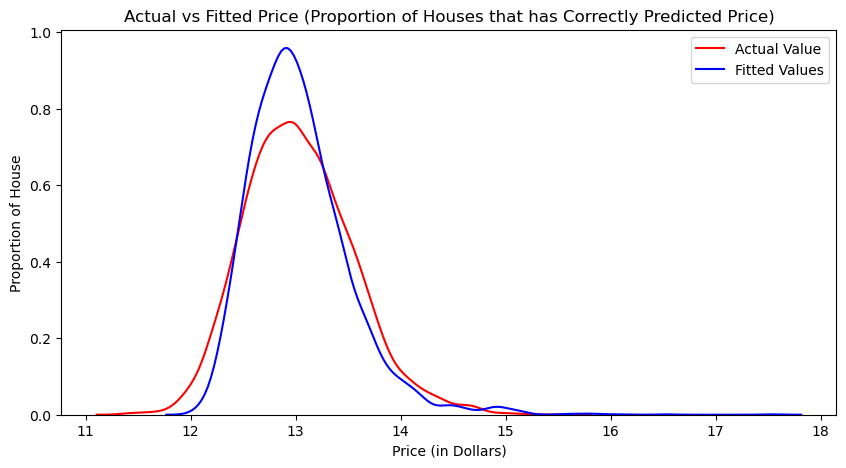

In [61]:
plt.figure(figsize=(10,5))
ax = sns.distplot(y_test, hist=False, color='r', label='Actual Value')
sns.distplot(y_predict, hist=False, color='b', label='Fitted Values', ax=ax)
plt.legend()

plt.title('Actual vs Fitted Price (Proportion of Houses that has Correctly Predicted Price)')
plt.ylabel('Proportion of House')
plt.xlabel('Price (in Dollars)')

plt.show()

### Ordinary Linear Regression (OLS) / Multi Regression Model

OLS is a method for estimating the unknown parameters in a linear regression model. OLS chooses the parameters of a linear function of a set of explanatory variables by minimizing the sum of the squares of the differences between the target dependent variable and those predicted by the linear function. In other words, it tries to minimizes the sum of squared errors (SSE) or mean squared error (MSE) between the target variable (y) and our predicted output ($\hat{y}$) over all samples in the dataset.

OLS can find the best parameters using of the following methods:

*   Solving the model parameters analytically using closed-form equations
*   Using an optimization algorithm (Gradient Descent, Stochastic Gradient Descent, Newton’s Method, etc.)

In [62]:
# Build the model with all the features first
# Adding the intercept term
ols_train_scaled = sm.add_constant(x_train_scaled)

# Calling the OLS algo on the train features and the target variable
ols_model = sm.OLS(np.array(y_train).reshape(-1, 1), ols_train_scaled)

# Fitting the model
ols_res = ols_model.fit()

print(ols_res.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.889
Model:                            OLS   Adj. R-squared:                  0.889
Method:                 Least Squares   F-statistic:                     6616.
Date:                Sat, 20 Jul 2024   Prob (F-statistic):               0.00
Time:                        00:33:26   Log-Likelihood:                 5517.1
No. Observations:               17290   AIC:                        -1.099e+04
Df Residuals:                   17268   BIC:                        -1.082e+04
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                13.0514      0.00

**Observations:**

- We can see that the **R-squared** for the model is **0.889**. 
- Not all the variables are statistically significant to predict the outcome variable. To check which variables are statistically significant or have predictive power to predict the target variable, we need to check the **p-value** against all the independent variables.

**Interpreting the Regression Results:**

1. **Adj. R-squared**: It reflects the fit of the model.
    - Adjusted R-squared values range from 0 to 1, where a higher value generally indicates a better fit, assuming certain conditions are met.
    - In our case, the value for Adjusted R-squared is **0.889**.

2. **coeff**: It represents the change in the output Y due to a change of one unit in the independent variable (everything else held constant).
3. **std err**: It reflects the level of accuracy of the coefficients.
    - The lower it is, the more accurate the coefficients are.
4. **P >|t|**: It is the p-value.
   
   * Pr(>|t|) : For each independent feature, there is a null hypothesis and alternate hypothesis.

    Ho : Independent feature is not significant. 
   
    Ha : Independent feature is significant. 
    
   * The p-value of less than 0.05 is considered to be statistically significant with a confidence level of 95%. 
       
   <u>By convention, when the</u>

   * p-value is $<$ 0.001: we say there is strong evidence that the correlation is significant.
   * the p-value is $<$ 0.05: there is moderate evidence that the correlation is significant.
   * the p-value is $<$ 0.1: there is weak evidence that the correlation is significant.
   * the p-value is $>$ 0.1: there is no evidence that the correlation is significant.

   *Note: To calculate P-value, we can also use Pearson Correlation from the stats.pearsonr() library to compare between 2 features, ie: view and price. See below:*
   
   ```pearson_coef, p_value = stats.pearson(df_refactored['view'], df_refactored['price'])```
   
   <br/>
   
5. **Confidence Interval**: It represents the range in which our coefficients are likely to fall (with a likelihood of 95%).
6. **F-Statistic**: F-statistics is based on the ratio of two variances: the explained variance (due to the model) and the unexplained variance (residuals). In other words, F-statistics compares the explained variance (due to the model) and the unexplained variance (residuals). By comparing these variances, F-statistics helps us determine whether the regression model significantly explains the variation in the dependent variable or if the variation can be attributed to random chance.

   * The f-test / f-statistic formula for simple or multiple regression model can be calculated as the following:

   ```f = MSR / MSE = Mean sum of squares regression / Mean sum of squares error```

   * The F-statistic follows an F-distribution, and its value helps to determine the probability (p-value) of observing such a statistic if the null hypothesis is true (i.e., no relationship between the dependent and independent variables). If the p-value is smaller than a predetermined significance level (e.g., 0.05), the null hypothesis is rejected, and we conclude that the regression model is statistically significant.
   
   *Note: We can use the ANOVA (Analysis of Variance) statistical method to test whether there are significant difference between the mean of two or more group.*
   
   *ANOVA returns two parameters:*

   ***F-test score**: ANOVA assumes the means of all groups are the same, calculates how much the actual means deviate from the assumption, and reports it as the F-test score. A larger score means there is a larger difference between the means.*
   
   ***P-value**:  P-value tells how statistically significant our calculated score value is.*
   
   *If our price variable is strongly correlated with the variable we are analyzing, we expect ANOVA to return a sizeable F-test score and a small p-value.*
   
   *Sample ANOVA code:*
   
   ```f_val, p_val = stats.f_oneway(group_test1, group_test2, group_test3)```
   
   

#### Test for multicollinearity using VIF (Varation Inflation Factor)

* Multicollinearity occurs when predictor variables in a regression model are correlated. This correlation is a problem because predictor variables should be independent. If the correlation between independent variables is high, it can cause problems when we fit the model and interpret the results. When we have multicollinearity in the linear model, the coefficients that the model suggests are unreliable.

* There are different ways of detecting (or testing) multicollinearity. One such way is the Variation Inflation Factor.

* **Variance Inflation factor**:  Variance inflation factor measures the inflation in the variances of the regression parameter estimates due to collinearities that exist among the predictors.  It is a measure of how much the variance of the estimated regression coefficient βk is “inflated” by the existence of correlation among the predictor variables in the model. 

* General Rule of thumb: If VIF is 1, then there is no correlation between the kth predictor and the remaining predictor variables, and hence the variance of β̂k is not inflated at all. Whereas, if VIF exceeds 5 or is close to exceeding 5, we say there is moderate VIF and if it is 10 or exceeds 10, it shows signs of high multicollinearity.

In [63]:
vif_series = pd.Series(
    [variance_inflation_factor(ols_train_scaled.values, i) for i in range(ols_train_scaled.shape[1])],
    index=ols_train_scaled.columns,
    dtype=float
)

print(f"VIF Score: \n{vif_series}")

VIF Score: 
const                    1.00
sqft_lot15               2.26
sqft_living15_log        2.79
renovated_before    16,340.68
year_sold                 inf
view                     1.51
zipcode                  1.70
sqft_above_log          30.19
sqft_lot                 2.22
yr_built                  inf
floors                   2.09
condition                1.28
bathrooms_log            3.38
yr_renovated        16,342.66
price                    3.08
sqft_living_log         36.05
lat                      1.34
bedrooms                 1.78
grade                    3.73
sqft_basement            8.95
long                     1.85
waterfront               1.30
age_sold                  inf
dtype: float64


The following features has a high VIF score:
- year_sold
- age_sold
- yr_renovated
- yr_built
- sqft_living_log (we will keep this since it has highest correlation with price)
- sqft_above_log

lets try to drop these features and see if the model improves.

In [64]:
# Run OLS algorithm again but this time, we remove the high VIF features and only include features that has positive correlation to the price as mention in above heatmap
# The features that has high correlation to price is:
# - sqft_living
# - grade
# - sqft_above
# - sqft_living15
# - bathrooms

# We will use the log transform data to maintain normality
col_mlr = ['sqft_living_log', 'grade', 'sqft_above_log', 'sqft_living15_log', 'bathrooms_log']
x_train_scaled_revise = scaler.fit_transform(x_train[col_mlr])
x_test_scaled_revise = scaler.transform(x_test[col_mlr])

# Convert the array back to pandas dataframe
x_train_scaled_revise = pd.DataFrame(x_train_scaled_revise, columns=col_mlr)

x_train_scaled_revise.head()

,sqft_living_log,grade,sqft_above_log,sqft_living15_log,bathrooms_log
0,-0.45,-0.56,-0.98,-0.19,-1.73
1,-0.15,0.29,-0.69,0.63,0.60
2,-1.30,0.29,-0.93,-0.29,-0.70
3,0.35,0.29,0.71,0.14,0.60
4,-0.13,-0.56,-0.63,-0.15,0.60


In [65]:
# Adding the intercept term
ols_train_scaled_revise = sm.add_constant(x_train_scaled_revise)

# Calling the OLS algo on the train features and the target variable
ols_model_revise = sm.OLS(np.array(y_train).reshape(-1, 1), ols_train_scaled_revise)

# Fitting the model
ols_res_revise = ols_model_revise.fit()

print(ols_res_revise.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.561
Model:                            OLS   Adj. R-squared:                  0.561
Method:                 Least Squares   F-statistic:                     4424.
Date:                Sat, 20 Jul 2024   Prob (F-statistic):               0.00
Time:                        00:33:26   Log-Likelihood:                -6397.0
No. Observations:               17290   AIC:                         1.281e+04
Df Residuals:                   17284   BIC:                         1.285e+04
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                13.0514      0.00

The revise OLS model now has a R-Square of 0.561 which is lower than the previous OLS model. However, the multicollinearity error has now disappear and all the P-values round to 0. The current model can account for about 56.1% of the variability of price around it mean. The null hypothesis for multiple regression is that there is no relationship between the chosen explanatory variables and response variable. All the p-values round to 0, which means that we can reject the null hypothesis. Now, we can confirm that the model satisfies the assumption of normality and homoscedasticity.

#### Normality of Residual

Quantile-quatile plots are one way to check the normality assumption. If the residuals are normally distributed, their point will mostly fall along a straight line. Below is a Q-Q plot of the model residual

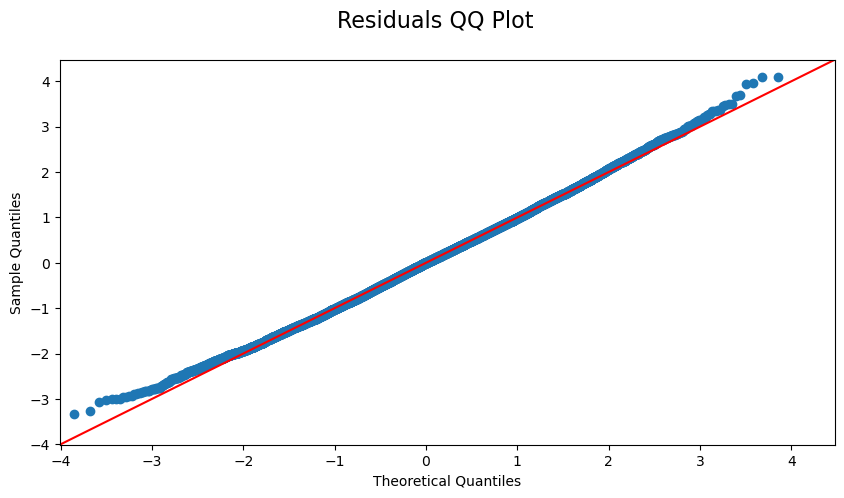

In [66]:
residuals = ols_res_revise.resid
fig = sm.graphics.qqplot(residuals, dist=stats.norm, line='45', fit=True)
fig.suptitle('Residuals QQ Plot', fontsize=16)
fig.set_size_inches(10, 5)
fig.show()

#### Homoscedasticity

The homoscedasticity assumption states that for any value of x, the variance of the residuals is roughly the same. To visualize this, I made a scatterplot with the model’s residuals on the y axis and fitted values on the x-axis. For the homoscedasticity assumption to be satisfied, the shape of the points should be roughly symmetrical across a line at y=0.


Text(0.5, 0.99, 'Residuals Scatterplot')

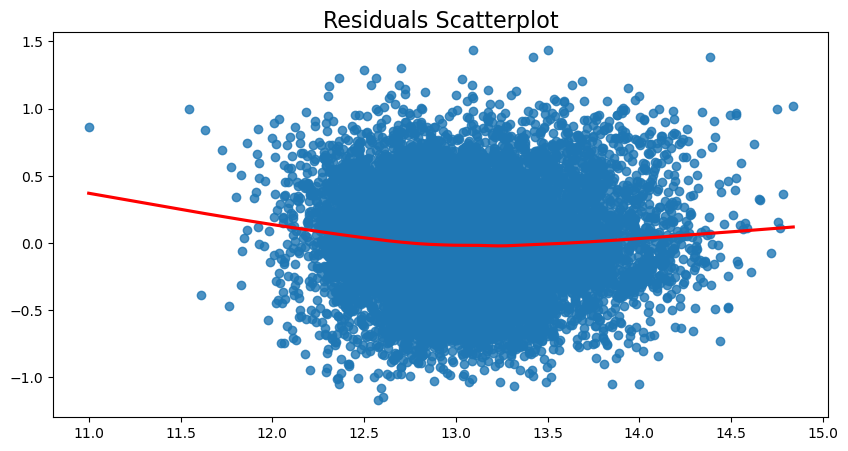

In [67]:
plt.figure(figsize=(10,5))
sns.regplot(x=ols_res_revise.predict(), y=ols_res_revise.resid, lowess=True, line_kws={'color': 'red'})
plt.title('Residuals Scatterplot', fontsize=16, y=.99)

We can see that the points have a roughly symmetrical blob-like shape that is consistent across the x-axis. The model satisfies — last, but not least — the assumption of homoscedasticity.

### Polynomial Regression

In [68]:
polyfeat = PolynomialFeatures(degree=2, include_bias=False)
x_train_poly = polyfeat.fit_transform(x_train_scaled)
x_test_poly = polyfeat.transform(x_test_scaled)

print(f"Shape of X_train_poly: {x_train_poly.shape[0]}")
print(f"Shape of X_test_poly: {x_test_poly.shape[0]}")

poly = LinearRegression()
poly.fit(x_train_poly, y_train)

Shape of X_train_poly: 17290
Shape of X_test_poly: 4323


LinearRegression()

In [69]:
y_pred_poly = poly.predict(x_test_poly)

# calculate the mean squared error
poly_mse = metrics.mean_squared_error(y_test, y_pred_poly)
print(f"Mean Square Error for Test Data Polynomial Fit: {poly_mse:.3f}")

# calculate the R^2 score
poly_r2_train = poly.score(x_train_poly, y_train)
poly_r2_test = poly.score(x_test_poly, y_test)
print(f"R^2 score for Train Data Polynomial Fit: {poly_r2_train:.3f}")
print(f"R^2 score for Test Data Polynomial Fit: {poly_r2_test:.3f}")

res['polynomial'] = {'mse': poly_mse, 'r2_score_train': poly_r2_train, 'r2_score_test': poly_r2_test}

Mean Square Error for Test Data Polynomial Fit: 0.005
R^2 score for Train Data Polynomial Fit: 0.983
R^2 score for Test Data Polynomial Fit: 0.983


#### GridsearchCV for Polynomial Regression

In [70]:
# Create polynomial feature pipeline
Input = [
    ('polynomial', PolynomialFeatures(include_bias=False, degree=2)),
    ('model', LinearRegression())]
pipe = Pipeline(Input)

param_grid = {
    "polynomial__degree": [1, 2, 3]
}

search = GridSearchCV(pipe, param_grid, n_jobs=1)

search.fit(x_train_scaled, y_train)

# obtain the estimator with the best parameters and assign it to the variable best
best = search.best_estimator_
print(f"Best estimator: {best.get_params()}")

Best estimator: {'memory': None, 'steps': [('polynomial', PolynomialFeatures(include_bias=False)), ('model', LinearRegression())], 'verbose': False, 'polynomial': PolynomialFeatures(include_bias=False), 'model': LinearRegression(), 'polynomial__degree': 2, 'polynomial__include_bias': False, 'polynomial__interaction_only': False, 'polynomial__order': 'C', 'model__copy_X': True, 'model__fit_intercept': True, 'model__n_jobs': None, 'model__positive': False}


In [71]:
print("Best params:", search.best_params_)

Best params: {'polynomial__degree': 2}


In [72]:
# Plot the R^2 against polynomial order to visualize overfitting

# Rsqu_test = []

# order = [1, 2, 3, 4]
# lr = LinearRegression()
# for n in order:
#     pr = PolynomialFeatures(degree=n)
    
#     x_train_pr = pr.fit_transform(x_train_scaled)
    
#     x_test_pr = pr.fit_transform(x_test_scaled)    
    
#     lr.fit(x_train_pr, y_train)
    
#     Rsqu_test.append(lr.score(x_test_pr, y_test))

# plt.plot(order, Rsqu_test)
# plt.xlabel('order')
# plt.ylabel('R^2')
# plt.title('R^2 Using Test Data')
# plt.text(3, 0.75, 'Maximum R^2 ') 

As we can see from the gridsearchCV, polynomial of the order 2 is the best fit, hence, our initial model is good to go!

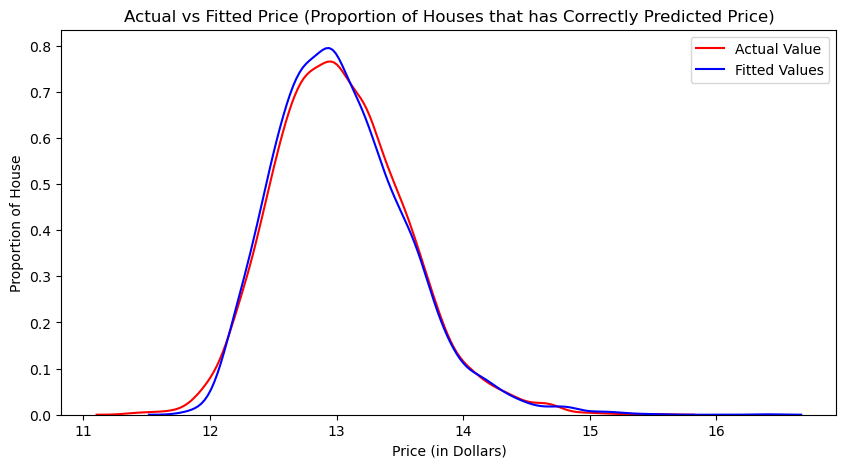

In [73]:
y_pred_best = best.predict(x_test_scaled)
y_pred_best
plt.figure(figsize=(10,5))
ax = sns.distplot(y_test, hist=False, color='r', label='Actual Value')
sns.distplot(y_pred_best, hist=False, color='b', label='Fitted Values', ax=ax)
plt.legend()

plt.title('Actual vs Fitted Price (Proportion of Houses that has Correctly Predicted Price)')
plt.ylabel('Proportion of House')
plt.xlabel('Price (in Dollars)')

plt.show()


From the density plot, we can see that the predicted housing price is very close to the actual values, suggesting that the model is good fit

#### R^2 of object pipeline with gridsearch for each individual features

sqft_lot15
Pipeline(steps=[('polynomial',
                 PolynomialFeatures(degree=4, include_bias=False)),
                ('model', LinearRegression())])
sqft_living15_log
Pipeline(steps=[('polynomial',
                 PolynomialFeatures(degree=5, include_bias=False)),
                ('model', LinearRegression())])
renovated_before
Pipeline(steps=[('polynomial', PolynomialFeatures(include_bias=False)),
                ('model', LinearRegression())])
year_sold
Pipeline(steps=[('polynomial', PolynomialFeatures(include_bias=False)),
                ('model', LinearRegression())])
view
Pipeline(steps=[('polynomial',
                 PolynomialFeatures(degree=5, include_bias=False)),
                ('model', LinearRegression())])
zipcode
Pipeline(steps=[('polynomial',
                 PolynomialFeatures(degree=5, include_bias=False)),
                ('model', LinearRegression())])
sqft_above_log
Pipeline(steps=[('polynomial',
                 PolynomialFeatures(degree=5, include_bia

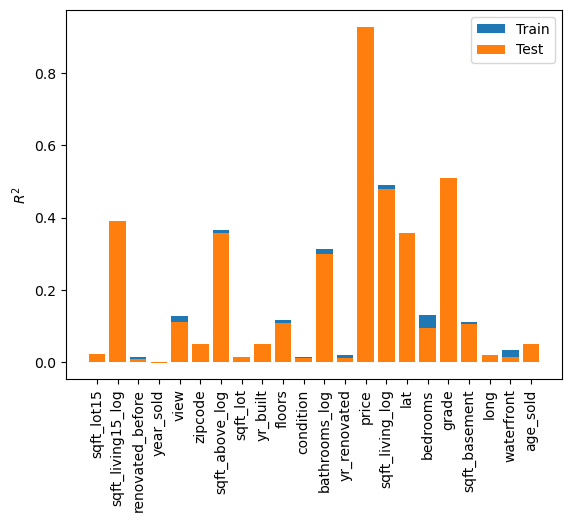

Training R^2 mean value 0.18517793292449192 Testing R^2 mean value 0.1813785413227068 
Training R^2 max value 0.9133312571038422 Testing R^2 max value 0.9284991194790736 


In [74]:
features = list(X)
R_2_train = []
R_2_test = []

for feature in features:
    param_grid = {
        "polynomial__degree": [ 1, 2,3,4,5],
        "model__positive":[True, False]
    }
    Input=[ ('polynomial', PolynomialFeatures(include_bias=False,degree=2)), ('model',LinearRegression())]
    pipe=Pipeline(Input)
    print(feature)
    search = GridSearchCV(pipe, param_grid, n_jobs=2)
    search.fit(x_train_scaled[[feature]], y_train)
    best=search.best_estimator_
    
    # Obtain the estimator with the best parameters
    bestLr = search.best_estimator_
    print(bestLr)
    
    # test our model on the test data
    R_2_test.append(bestLr.score(x_test_scaled_plot[[feature]], y_test))
    
    # test our model on the train data
    R_2_train.append(bestLr.score(x_train_scaled[[feature]], y_train))
    
    
plt.bar(features,R_2_train,label="Train")
plt.bar(features,R_2_test,label="Test")
plt.xticks(rotation=90)
plt.ylabel("$R^2$")
plt.legend()
plt.show()
print(f"Training R^2 mean value {np.mean(R_2_train)} Testing R^2 mean value {np.mean(R_2_test)} ")
print(f"Training R^2 max value {np.max(R_2_train)} Testing R^2 max value {np.max(R_2_test)} ")

### Ridge Regression (L2 regularization)

Ridge regression addresses some of the problems of Ordinary Least Squares by imposing a penalty on the size of the coefficients with L2 regularization

In [75]:
rr = Ridge(alpha=0.001)
rr.fit(x_train_scaled, y_train)

Ridge(alpha=0.001)

In [76]:
print('Intercept: {}'.format(rr.intercept_))
print('Regression Coefficients:')
pd.DataFrame(rr.coef_, index=x_train_scaled.columns, columns=['Coefficient'])

Intercept: 13.05141251859369
Regression Coefficients:


,Coefficient
sqft_lot15,-0.00
sqft_living15_log,0.05
renovated_before,-0.90
year_sold,0.01
view,0.02
zipcode,-0.01
sqft_above_log,-0.19
sqft_lot,0.02
yr_built,-0.02
floors,0.03


In [77]:
# return the coefficient of determination of R^2 of the prediction
rr_r2 = rr.score(x_train_scaled, y_train)
print(f'Ridge Regression Training data R^2: {rr_r2:.3f}')

Ridge Regression Training data R^2: 0.889


In [78]:
# used the scaled test data to generate the prediction price
y_predict_rr = rr.predict(x_test_scaled)

# calculate mean-squared-error
rr_mse = metrics.mean_squared_error(y_test, y_predict_rr)
rr_mse

0.02739015512131889

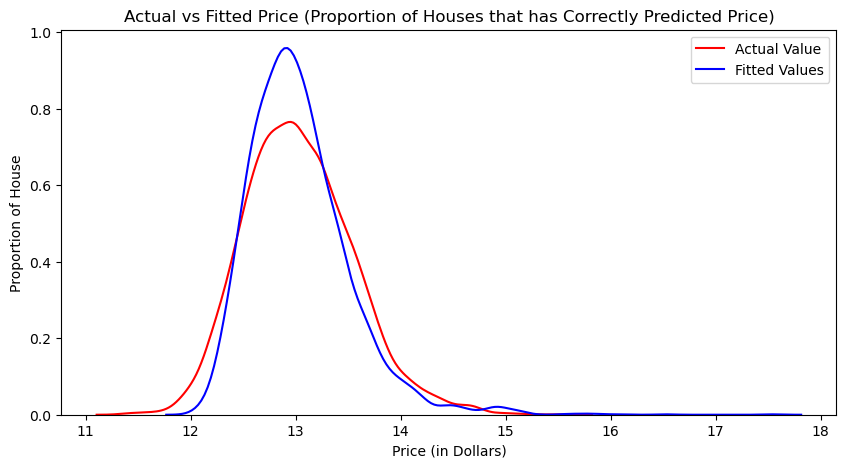

In [79]:
plt.figure(figsize=(10,5))
ax = sns.distplot(y_test, hist=False, color='r', label='Actual Value')
sns.distplot(y_predict_rr, hist=False, color='b', label='Fitted Values', ax=ax)
plt.legend()

plt.title('Actual vs Fitted Price (Proportion of Houses that has Correctly Predicted Price)')
plt.ylabel('Proportion of House')
plt.xlabel('Price (in Dollars)')

plt.show()

#### Using GridSearch with Ridge Regression to Tune the alpha hyperparameter

In [80]:
rr_tune = Ridge()
parameter = [{'alpha': [0.001, 0.1, 1, 10, 100, 1000, 10000, 100000]}]

# create a ridge grid search object
grid = GridSearchCV(rr_tune, parameter, cv=4)

# fit the model
grid.fit(x_train_scaled, y_train)

GridSearchCV(cv=4, estimator=Ridge(),
             param_grid=[{'alpha': [0.001, 0.1, 1, 10, 100, 1000, 10000,
                                    100000]}])

In [81]:
best_rr = grid.best_estimator_
best_rr

Ridge(alpha=0.1)

In [82]:
# predict the price using the best ridge estimator
y_predict_best_rr = best_rr.predict(x_test_scaled)

# Test our model on the test data using the best estimator
rr_r2_train = best_rr.score(x_train_scaled, y_train)
rr_r2_test = best_rr.score(x_test_scaled, y_test)
rr_mse_best = metrics.mean_squared_error(y_test, y_predict_best_rr)

print(f"R^2 score for Train Data ridge Fit: {rr_r2_train:.3f}")
print(f"R^2 score for Test Data ridge Fit: {rr_r2_test:.3f}")
print(f"MSE for prediction: {rr_mse_best}")

R^2 score for Train Data ridge Fit: 0.889
R^2 score for Test Data ridge Fit: 0.898
MSE for prediction: 0.027386152897003652


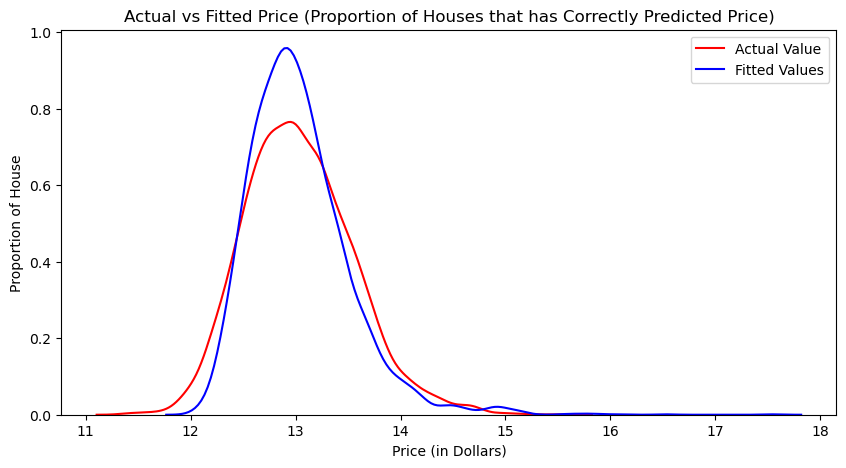

In [83]:
# plot the graph of actual vs fitted price for the best estimator ridge regression
plt.figure(figsize=(10,5))
ax = sns.distplot(y_test, hist=False, color='r', label='Actual Value')
sns.distplot(y_predict_best_rr, hist=False, color='b', label='Fitted Values', ax=ax)
plt.legend()

plt.title('Actual vs Fitted Price (Proportion of Houses that has Correctly Predicted Price)')
plt.ylabel('Proportion of House')
plt.xlabel('Price (in Dollars)')

plt.show()

In [84]:
res['ridge'] = {
    'mse': rr_mse_best,
    'r2_score_train': rr_r2_train,
    'r2_score_test': rr_r2_test
}

### Lasso Regression (L1 Regularization)

The lasso is a linear model that estimate sparse coefficient with L1 regularization

In [85]:
lasso_m = Lasso(alpha=0.0001)
lasso_m.fit(x_train_scaled, y_train)

Lasso(alpha=0.0001)

In [86]:
print('Intercept: {}'.format(lasso_m.intercept_))
print('Regression Coefficients:')
pd.DataFrame(lasso_m.coef_, index=x_train_scaled.columns, columns=['Coefficient'])

Intercept: 13.05141251859369
Regression Coefficients:


,Coefficient
sqft_lot15,-0.00
sqft_living15_log,0.05
renovated_before,0.00
year_sold,0.01
view,0.02
zipcode,-0.01
sqft_above_log,-0.18
sqft_lot,0.02
yr_built,-0.00
floors,0.03


In [87]:
# return the coefficient of determination of R^2 of the prediction
lasso_r2 = lasso_m.score(x_train_scaled, y_train)
print(f'Lasso Regression Training data R^2: {lasso_r2:.3f}')

Lasso Regression Training data R^2: 0.889


In [88]:
# used the scaled test data to generate the prediction price
y_predict_lasso = lasso_m.predict(x_test_scaled)

# calculate mean-squared-error
lasso_mse = metrics.mean_squared_error(y_test, y_predict_lasso)
lasso_mse

0.027395682157267585

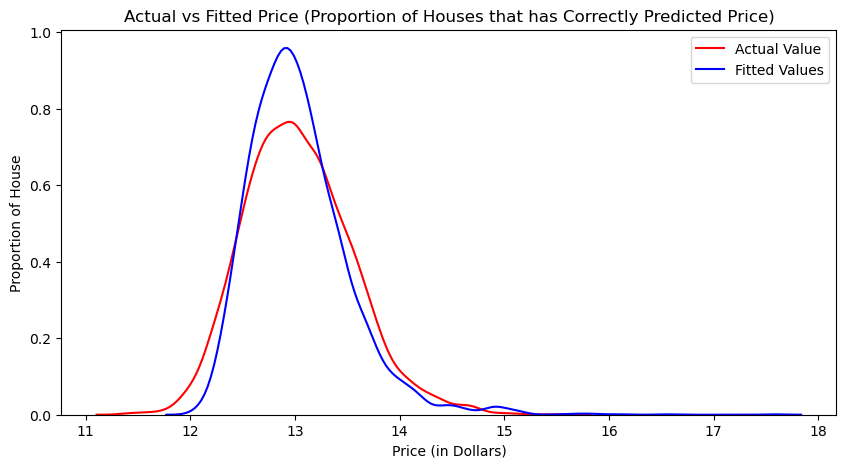

In [89]:
plt.figure(figsize=(10,5))
ax = sns.distplot(y_test, hist=False, color='r', label='Actual Value')
sns.distplot(y_predict_lasso, hist=False, color='b', label='Fitted Values', ax=ax)
plt.legend()

plt.title('Actual vs Fitted Price (Proportion of Houses that has Correctly Predicted Price)')
plt.ylabel('Proportion of House')
plt.xlabel('Price (in Dollars)')

plt.show()


#### Using GridSearch with Lasso Regression to Tune the alpha hyperparameter

In [90]:
lasso_tune = Lasso()
parameter = [{'alpha': [0.001, 0.1, 1, 10, 100, 1000, 10000, 100000]}]

# create a ridge grid search object
grid_lasso = GridSearchCV(lasso_tune, parameter, cv=4)

# fit the model
grid_lasso.fit(x_train_scaled, y_train)

GridSearchCV(cv=4, estimator=Lasso(),
             param_grid=[{'alpha': [0.001, 0.1, 1, 10, 100, 1000, 10000,
                                    100000]}])

In [91]:
best_lasso = grid_lasso.best_estimator_
best_lasso

Lasso(alpha=0.001)

In [92]:
# predict the price using the best ridge estimator
y_predict_best_lasso = best_lasso.predict(x_test_scaled)

# Test our model on the test data using the best estimator
lasso_r2_train = best_lasso.score(x_train_scaled, y_train)
lasso_r2_test = best_lasso.score(x_test_scaled, y_test)
lasso_mse_best = metrics.mean_squared_error(y_test, y_predict_best_lasso)

print(f"R^2 score for Train Data Lasso Fit: {lasso_r2_train:.3f}")
print(f"R^2 score for Test Data Lasso Fit: {lasso_r2_test:.3f}")
print(f"MSE for prediction: {lasso_mse_best}")

R^2 score for Train Data Lasso Fit: 0.888
R^2 score for Test Data Lasso Fit: 0.897
MSE for prediction: 0.027553931682583237


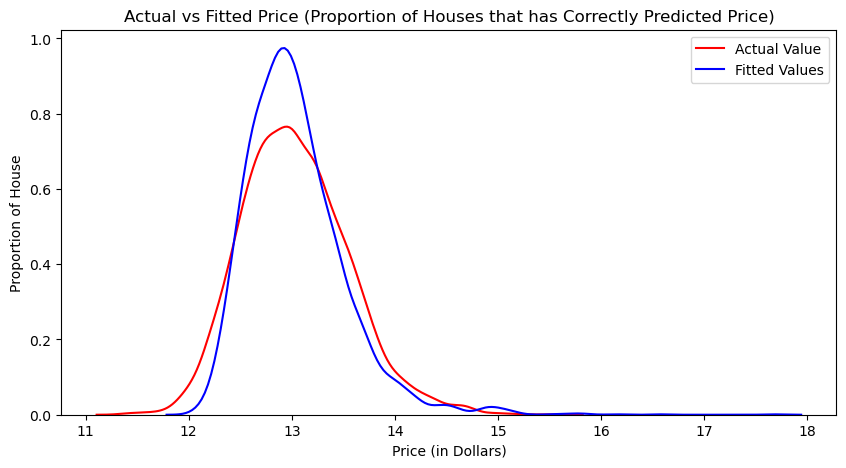

In [93]:
# plot the graph of actual vs fitted price for the best estimator Lasso regression
plt.figure(figsize=(10,5))
ax = sns.distplot(y_test, hist=False, color='r', label='Actual Value')
sns.distplot(y_predict_best_lasso, hist=False, color='b', label='Fitted Values', ax=ax)
plt.legend()

plt.title('Actual vs Fitted Price (Proportion of Houses that has Correctly Predicted Price)')
plt.ylabel('Proportion of House')
plt.xlabel('Price (in Dollars)')

plt.show()

In [94]:
res['lasso'] = {'mse': lasso_mse_best, 'r2_score_train': lasso_r2_train, 'r2_score_test': lasso_r2_test}

### Elastic Net

Elastic net combiens L1 and L2 prior as regularizes or penalties.

In [95]:
enet = ElasticNet(alpha=0.1, l1_ratio=0.5)
enet.fit(x_train_scaled, y_train)

ElasticNet(alpha=0.1)

In [96]:
print('Intercept: {}'.format(enet.intercept_))
print('Regression Coefficients:')
pd.DataFrame(enet.coef_, index=x_train_scaled.columns, columns=['Coefficient'])

Intercept: 13.05141251859369
Regression Coefficients:


,Coefficient
sqft_lot15,0.00
sqft_living15_log,0.02
renovated_before,0.00
year_sold,0.00
view,0.00
zipcode,0.00
sqft_above_log,0.00
sqft_lot,0.00
yr_built,-0.00
floors,0.00


In [97]:
# return the coefficient of determination of R^2 of the prediction
enet_r2 = enet.score(x_train_scaled, y_train)
print(f'Elastic Net Regression Training data R^2: {enet_r2:.3f}')

Elastic Net Regression Training data R^2: 0.853


In [98]:
# used the scaled test data to generate the prediction price
y_predict_enet = enet.predict(x_test_scaled)

# calculate mean-squared-error
enet_mse = metrics.mean_squared_error(y_test, y_predict_enet)
enet_mse

0.0375962899505863

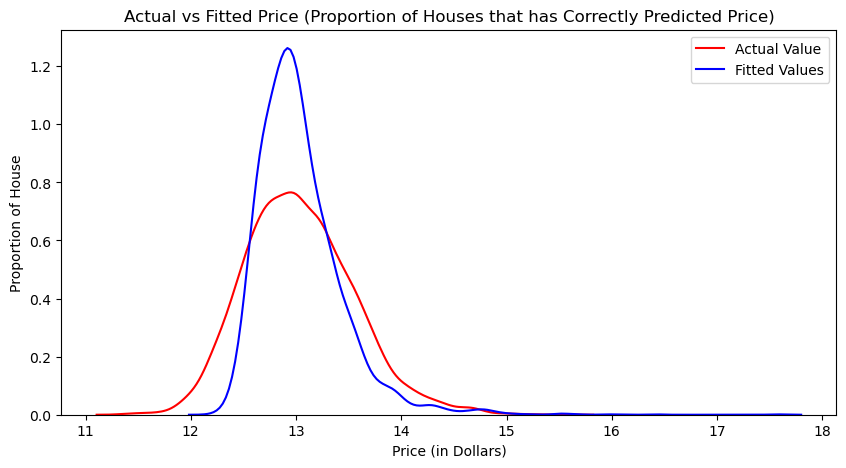

In [99]:
plt.figure(figsize=(10,5))
ax = sns.distplot(y_test, hist=False, color='r', label='Actual Value')
sns.distplot(y_predict_enet, hist=False, color='b', label='Fitted Values', ax=ax)
plt.legend()

plt.title('Actual vs Fitted Price (Proportion of Houses that has Correctly Predicted Price)')
plt.ylabel('Proportion of House')
plt.xlabel('Price (in Dollars)')

plt.show()



#### Apply Elastic Net with Polynomial Transformation and tune hyperparameter with GridSearchCV

We already established that polynomial of the order=2 is the best fit to the data, hence, we will use that to start to tune our model on the alpha and l1_ratio parameters

In [120]:
param_grid = {
    "model__alpha":[0.001,0.01,0.1,1,10],
    "model__l1_ratio":[0.1,0.25,0.5,0.75,0.9]
}
Input = [
    ('polynomial', PolynomialFeatures(degree=2, include_bias=False)),
    ('model', ElasticNet(alpha=0.001, l1_ratio=0.1, max_iter=10000, warm_start=False, random_state=42))
]
pipe = Pipeline(Input)
search = GridSearchCV(pipe, param_grid, cv=3)
search.fit(x_train_scaled, y_train)


GridSearchCV(cv=3,
             estimator=Pipeline(steps=[('polynomial',
                                        PolynomialFeatures(include_bias=False)),
                                       ('model',
                                        ElasticNet(alpha=0.001, l1_ratio=0.1,
                                                   max_iter=10000,
                                                   random_state=42))]),
             param_grid={'model__alpha': [0.001, 0.01, 0.1, 1, 10],
                         'model__l1_ratio': [0.1, 0.25, 0.5, 0.75, 0.9]})

In [121]:
best_enet_poly = search.best_estimator_
best_enet_poly

Pipeline(steps=[('polynomial', PolynomialFeatures(include_bias=False)),
                ('model',
                 ElasticNet(alpha=0.001, l1_ratio=0.1, max_iter=10000,
                            random_state=42))])

In [122]:
print('Config: %s' % search.best_params_)

Config: {'model__alpha': 0.001, 'model__l1_ratio': 0.1}


In [123]:
# predict the price using the best elastic net estimator
y_predict_best_enet = best_enet_poly.predict(x_test_scaled)

# Test our model on the test data using the best estimator
enet_r2_train = best_enet_poly.score(x_train_scaled, y_train)
enet_r2_test = best_enet_poly.score(x_test_scaled, y_test)
enet_mse_best = metrics.mean_squared_error(y_test, y_predict_best_enet)

print(f"R^2 score for Train Data Elastic Net Fit: {enet_r2_train:.3f}")
print(f"R^2 score for Test Data Elastic Net Fit: {enet_r2_test:.3f}")
print(f"MSE for prediction: {enet_mse_best}")

R^2 score for Train Data Elastic Net Fit: 0.983
R^2 score for Test Data Elastic Net Fit: 0.982
MSE for prediction: 0.004814519361736253


In [124]:
res['enet poly'] = {'mse': enet_mse_best, 'r2_score_train': enet_r2_train, 'r2_score_test': enet_r2_test}

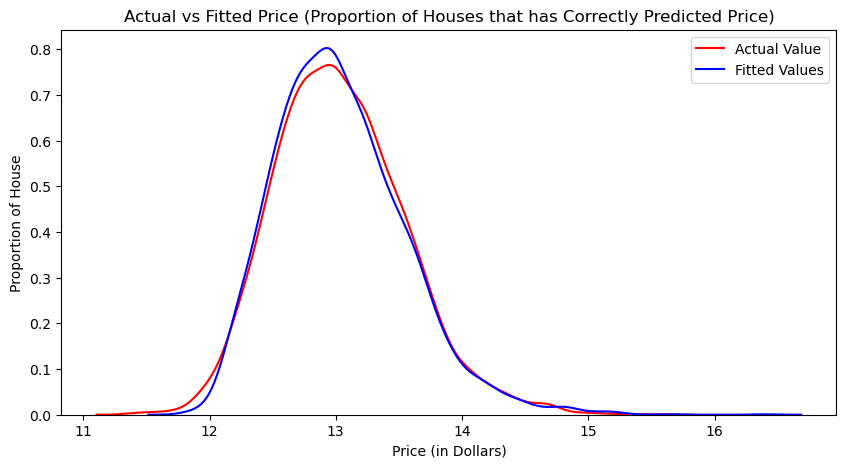

In [125]:
plt.figure(figsize=(10,5))
ax = sns.distplot(y_test, hist=False, color='r', label='Actual Value')
sns.distplot(y_predict_best_enet, hist=False, color='b', label='Fitted Values', ax=ax)
plt.legend()

plt.title('Actual vs Fitted Price (Proportion of Houses that has Correctly Predicted Price)')
plt.ylabel('Proportion of House')
plt.xlabel('Price (in Dollars)')

plt.show()



### Compare coefficient between model

In [126]:
# let's look at the absolute value of coefficients for each model

coefficients = pd.DataFrame()
coefficients['linear regression'] = lm.coef_.ravel()
coefficients['ridge regression'] = best_rr.coef_.ravel()
coefficients['lasso regression'] = best_lasso.coef_.ravel()
coefficients = coefficients.applymap(abs)

coefficients.describe()  # Huge difference in scale between non-regularized vs regularized regression

,linear regression,ridge regression,lasso regression
count,22.000,22.000,22.000
mean,0.142,0.129,0.050
std,0.261,0.222,0.076
min,0.003,0.003,0.000
25%,0.013,0.013,0.005
50%,0.025,0.025,0.019
75%,0.119,0.119,0.057
max,0.904,0.761,0.311


### Summary

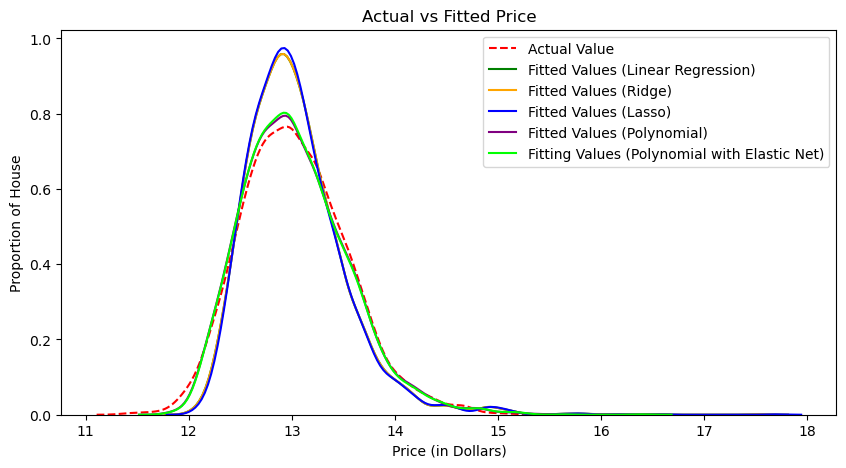

In [127]:
plt.figure(figsize=(10,5))
ax = sns.kdeplot(y_test, color='r', label='Actual Value', linestyle='dashed')
sns.kdeplot(y_predict, color='g', label='Fitted Values (Linear Regression)', ax=ax)
sns.kdeplot(y_predict_best_rr, color='orange', label='Fitted Values (Ridge)', ax=ax)
sns.kdeplot(y_predict_best_lasso, color='b', label='Fitted Values (Lasso)', ax=ax)
sns.kdeplot(y_pred_best, color='purple', label='Fitted Values (Polynomial)', ax=ax)
sns.kdeplot(y_predict_best_enet, color='lime', label='Fitting Values (Polynomial with Elastic Net)', ax=ax)
plt.legend()

plt.title('Actual vs Fitted Price')
plt.ylabel('Proportion of House')
plt.xlabel('Price (in Dollars)')

plt.show()

#### R^2 score and MSE of the models

In [128]:
res.T

,mse,r2_score_train,r2_score_test
linear_reg,0.027,0.889,0.898
polynomial,0.005,0.983,0.983
ridge,0.027,0.889,0.898
lasso,0.028,0.888,0.897
enet poly,0.005,0.983,0.982


Based on the above summary, polynomial model of degree 2 perform the best with an R^2 score of 0.98 and MSE of 0. There is no overfitting of the model, hence, the model is good.